# **LOAD DATA**

In [74]:
from datetime import datetime
current_time = datetime.now()

# Mencetak waktu dalam format jam:menit:detik
print("Starting Loading data")
print(current_time.strftime("%H:%M:%S"))

Starting Loading data
06:29:00


In [75]:
!pip install scikit-learn==1.3.2

Defaulting to user installation because normal site-packages is not writeable


In [76]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
Could not fetch URL https://pypi.org/simple/typing-extensions/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/typing-extensions/ (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: EE certificate key too weak (_ssl.c:1145)'))) - skipping
INFO: pip is looking at multiple versions of tensorflow to determine which version is compatible with other requirements. This could take a while.
Could not fetch URL https://pypi.org/simple/tensorflow/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/tensorflow/ (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: EE certificate key too weak (_ssl.c:1145)'))) - skipping
ERROR: Could 

In [77]:
!pip install torch

Defaulting to user installation because normal site-packages is not writeable


In [78]:
import torch
from torchvision.transforms import transforms
from torch.utils.data import DataLoader
from torch.optim import Adam
from torch.autograd import Variable
import torchvision

device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [79]:
import tensorflow as tf
print(tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2.13.1
Num GPUs Available:  1


In [80]:
# perangkat (GPU jika tersedia)
device_name = "/GPU:0" if tf.config.experimental.list_physical_devices('GPU') else "/CPU:0"
print(f"Using device: {device_name}")

Using device: /GPU:0


In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

In [82]:
df = pd.read_csv('creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

# **PREPROCESSING DATA**

In [84]:
current_time = datetime.now()

# Mencetak waktu dalam format jam:menit:detik
print("Starting Preprocessing data")
print(current_time.strftime("%H:%M:%S"))

Starting Preprocessing data
06:29:18


## EDA

array([[<Axes: title={'center': 'Time'}>, <Axes: title={'center': 'V1'}>,
        <Axes: title={'center': 'V2'}>, <Axes: title={'center': 'V3'}>,
        <Axes: title={'center': 'V4'}>, <Axes: title={'center': 'V5'}>],
       [<Axes: title={'center': 'V6'}>, <Axes: title={'center': 'V7'}>,
        <Axes: title={'center': 'V8'}>, <Axes: title={'center': 'V9'}>,
        <Axes: title={'center': 'V10'}>, <Axes: title={'center': 'V11'}>],
       [<Axes: title={'center': 'V12'}>, <Axes: title={'center': 'V13'}>,
        <Axes: title={'center': 'V14'}>, <Axes: title={'center': 'V15'}>,
        <Axes: title={'center': 'V16'}>, <Axes: title={'center': 'V17'}>],
       [<Axes: title={'center': 'V18'}>, <Axes: title={'center': 'V19'}>,
        <Axes: title={'center': 'V20'}>, <Axes: title={'center': 'V21'}>,
        <Axes: title={'center': 'V22'}>, <Axes: title={'center': 'V23'}>],
       [<Axes: title={'center': 'V24'}>, <Axes: title={'center': 'V25'}>,
        <Axes: title={'center': 'V26'}>, <

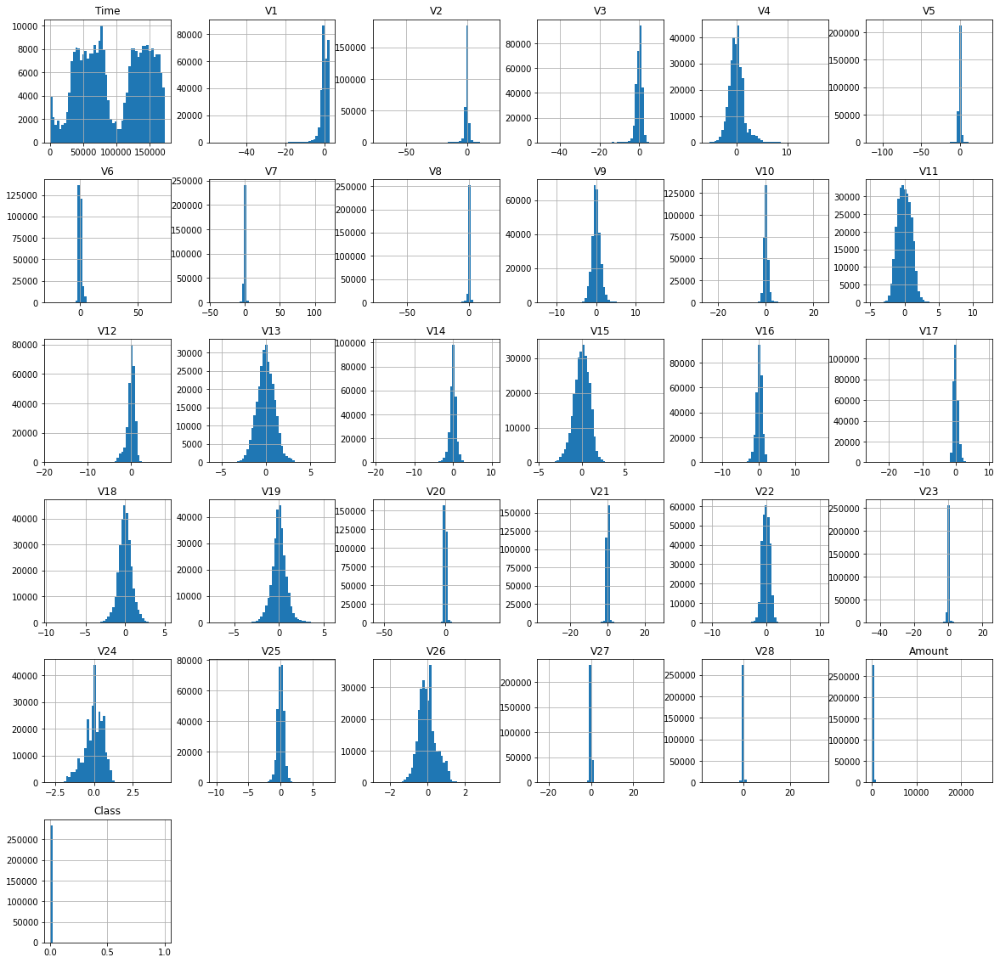

In [85]:
df.hist(figsize=(20,20), bins=50)

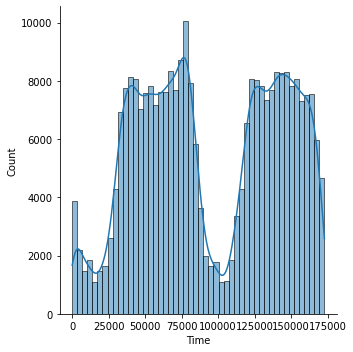

In [86]:
sns.displot(df['Time'], kde=True, bins=50)

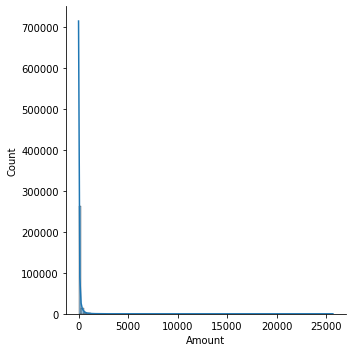

In [87]:
sns.displot(df['Amount'], kde=True, bins=100)

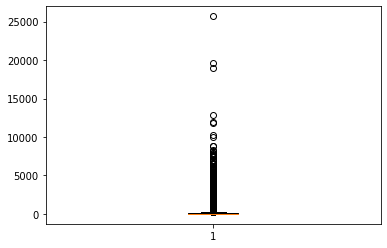

In [88]:
plt.boxplot(df["Amount"])
plt.show()

In [89]:
# memisahkan fitur-fitur dengan target
y = df["Class"]
x = df.drop("Class", axis=1)

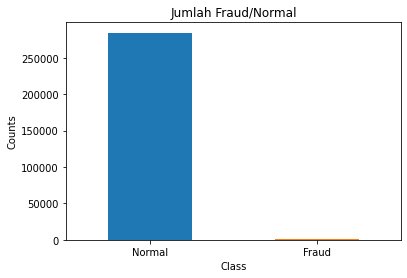

In [90]:
# Membandingkan data fraud dengan yang normal
import matplotlib.pyplot as plt

count_classes = pd.value_counts(df['Class'], sort = True).sort_index()
count_classes.plot(kind = 'bar', color=['C0', 'C1'])
plt.title('Jumlah Fraud/Normal')
plt.xticks(range(2), ['Normal', 'Fraud'], rotation = 0)
plt.xlabel("Class")
plt.ylabel("Counts")
plt.show()

## Data Scaling

In [91]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Inisialisasi StandardScaler
scaler = StandardScaler()

# Mengambil daftar fitur
features = x.columns.tolist()

def normalize(x):
    # Menyalin dataset untuk menghindari SettingWithCopyWarning
    X_normalized = x.copy()

    for feature in features:
        # Standardisasi fitur dengan .ravel() untuk menghindari FutureWarning
        X_normalized.loc[:, feature] = scaler.fit_transform(X_normalized[[feature]]).ravel().astype(np.float64)

    return X_normalized

# Normalisasi dataset
x = normalize(x)

In [92]:
x.head(10)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-1.996583,-0.694242,-0.044075,1.672773,0.973366,-0.245117,0.347068,0.193679,0.082637,0.331128,...,0.326118,-0.024923,0.382854,-0.176911,0.110507,0.246585,-0.392170,0.330892,-0.063781,0.244964
1,-1.996583,0.608496,0.161176,0.109797,0.316523,0.043483,-0.061820,-0.063700,0.071253,-0.232494,...,-0.089611,-0.307377,-0.880077,0.162201,-0.561131,0.320694,0.261069,-0.022256,0.044608,-0.342475
2,-1.996562,-0.693500,-0.811578,1.169468,0.268231,-0.364572,1.351454,0.639776,0.207373,-1.378675,...,0.680975,0.337632,1.063358,1.456320,-1.138092,-0.628537,-0.288447,-0.137137,-0.181021,1.160686
3,-1.996562,-0.493325,-0.112169,1.182516,-0.609727,-0.007469,0.936150,0.192071,0.316018,-1.262503,...,-0.269855,-0.147443,0.007267,-0.304777,-1.941027,1.241904,-0.460217,0.155396,0.186189,0.140534
4,-1.996541,-0.591330,0.531541,1.021412,0.284655,-0.295015,0.071999,0.479302,-0.226510,0.744326,...,0.529939,-0.012839,1.100011,-0.220123,0.233250,-0.395202,1.041611,0.543620,0.651816,-0.073403
5,-1.996541,-0.217475,0.581675,0.752585,-0.118833,0.305009,-0.022313,0.384936,0.217955,-0.517619,...,0.110215,-0.283522,-0.771427,-0.042273,-0.613273,-0.446584,0.219637,0.628900,0.245636,-0.338556
6,-1.996499,0.627795,0.085389,0.029923,0.849383,0.139020,0.204695,-0.004170,0.067998,0.423218,...,-0.284895,-0.228334,-0.373032,-0.246780,-1.287973,1.439037,-0.533436,0.085492,0.015656,-0.333279
7,-1.996436,-0.328928,0.858692,0.708576,-0.347631,0.687512,0.321345,0.905860,-3.188229,0.560129,...,-0.203317,2.645889,-1.399276,0.092085,-1.072754,-0.796633,-0.107075,-2.990154,-3.288083,-0.190107
8,-1.996436,-0.456573,0.173291,-0.074653,-0.191774,1.934149,2.793594,0.299206,0.712592,-0.356851,...,0.068406,-0.099963,-0.369425,-0.327055,1.670269,0.715943,-0.796633,0.029104,0.431420,0.019392
9,-1.996394,-0.172698,0.678005,0.688781,-0.156927,0.361792,-0.185219,0.526706,0.058223,-0.670587,...,0.264243,-0.336156,-0.873298,-0.193438,-0.635767,-0.133773,0.195342,0.610010,0.251681,-0.338516


## Data Splitting

In [93]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, stratify=y_train)
print("Training set size:", X_train.shape)
print("Validation set size:", X_val.shape)
print("Testing set size:", X_test.shape)

print("\nDistribusi di y_train:\n", pd.Series(y_train).value_counts())
print("Distribusi di y_val:\n", pd.Series(y_val).value_counts())
print("Distribusi di y_test:\n", pd.Series(y_test).value_counts())

Training set size: (205060, 30)
Validation set size: (22785, 30)
Testing set size: (56962, 30)

Distribusi di y_train:
 Class
0    204705
1       355
Name: count, dtype: int64
Distribusi di y_val:
 Class
0    22746
1       39
Name: count, dtype: int64
Distribusi di y_test:
 Class
0    56864
1       98
Name: count, dtype: int64


In [94]:
X_train.to_csv("X_train_gain.csv", index=False)
X_val.to_csv("X_val_gain.csv", index=False)
X_test.to_csv("X_test_gain.csv", index=False)

y_train.to_csv("y_train_gain.csv", index=False)
y_val.to_csv("y_val_gain.csv", index=False)
y_test.to_csv("y_test_gain.csv", index=False)

In [95]:
print(type(X_train))

<class 'pandas.core.frame.DataFrame'>


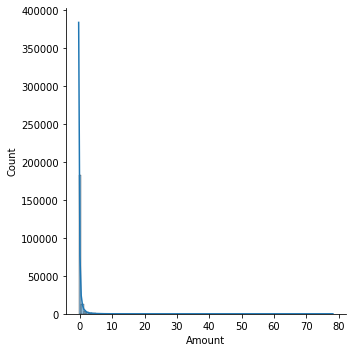

In [96]:
sns.displot(X_train['Amount'], kde=True, bins=100)

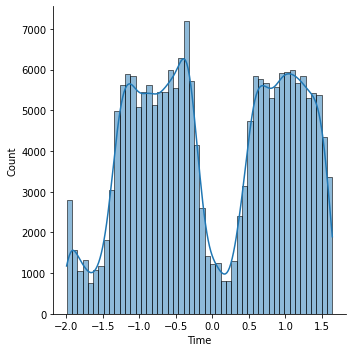

In [97]:
sns.displot(X_train['Time'], kde=True, bins=50)

## Imbalanced Data Handling

data test tidak diberi perlakuan imbalanced handling

In [98]:
!pip install imbalanced-learn==0.12.4

Defaulting to user installation because normal site-packages is not writeable


In [99]:
import imblearn
print(imblearn.__version__)

0.12.4


In [100]:
import sklearn
print(sklearn.__version__)

1.3.2


In [101]:
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import RandomUnderSampler

### Random Oversampling

In [102]:
# Menentukan jumlah sample yang diinginkan
jumlah_kelas_0 = y_train.value_counts()[0]  # Menghitung jumlah kelas 0
jumlah_kelas_1 = round(jumlah_kelas_0 * 1) # Menyamakan jumlah sample kelas 1 dengan jumlah dengan kelas 0

# Oversampling
oversampler = RandomOverSampler(sampling_strategy={0: jumlah_kelas_0, 1: jumlah_kelas_1}, random_state=42)
X_ros, y_ros = oversampler.fit_resample(X_train, y_train)

# Cek distribusi setelah oversampling
print(f"Distribusi sebelum oversampling:\n{y_train.value_counts()}")
print(f"Distribusi setelah oversampling:\n{pd.Series(y_ros).value_counts()}")

Distribusi sebelum oversampling:
Class
0    204705
1       355
Name: count, dtype: int64
Distribusi setelah oversampling:
Class
0    204705
1    204705
Name: count, dtype: int64


### SMOTE

In [103]:
# Menentukan jumlah kelas mayoritas (kelas 0)
jumlah_kelas_0 = y_train.value_counts()[0]
jumlah_kelas_1 = round(jumlah_kelas_0 * 1)

# Oversampling menggunakan SMOTE
smote = SMOTE(sampling_strategy={1: jumlah_kelas_1}, random_state=42)
X_smote, y_smote = smote.fit_resample(X_train, y_train)

# Cek distribusi setelah SMOTE
print(f"Distribusi sebelum SMOTE:\n{y_train.value_counts()}")
print(f"Distribusi setelah SMOTE:\n{pd.Series(y_smote).value_counts()}")

Distribusi sebelum SMOTE:
Class
0    204705
1       355
Name: count, dtype: int64
Distribusi setelah SMOTE:
Class
0    204705
1    204705
Name: count, dtype: int64


### Adasyn

In [104]:
# Menentukan jumlah kelas mayoritas (kelas 0)
jumlah_kelas_0 = y_train.value_counts()[0]
jumlah_kelas_1 = round(jumlah_kelas_0 * 1)

# Oversampling menggunakan ADASYN
adasyn = ADASYN(sampling_strategy={1: jumlah_kelas_1}, random_state=42)
X_adasyn, y_adasyn = adasyn.fit_resample(X_train, y_train)

# Cek distribusi kelas setelah ADASYN
print(f"Distribusi sebelum ADASYN:\n{y_train.value_counts()}")
print(f"Distribusi setelah ADASYN:\n{pd.Series(y_adasyn).value_counts()}")

Distribusi sebelum ADASYN:
Class
0    204705
1       355
Name: count, dtype: int64
Distribusi setelah ADASYN:
Class
0    204705
1    204689
Name: count, dtype: int64


### Random Undersampling

In [105]:
# Menentukan jumlah kelas minoritas (kelas 1)
jumlah_kelas_1 = y_train.value_counts()[1]
# Tentukan jumlah target untuk kelas mayoritas (kelas 0) agar menjadi 1% dari kelas 1
jumlah_kelas_0 = round(jumlah_kelas_1 // 1)

# Pastikan jumlah kelas 0 tidak menjadi 0
jumlah_kelas_0 = max(jumlah_kelas_0, 1)

# Undersampling
undersampler = RandomUnderSampler(sampling_strategy={0: jumlah_kelas_0, 1: jumlah_kelas_1}, random_state=42)
X_rus, y_rus = undersampler.fit_resample(X_train, y_train)

# Cek distribusi setelah undersampling
print(f"Distribusi sebelum undersampling:\n{y_train.value_counts()}")
print(f"Distribusi setelah undersampling:\n{pd.Series(y_rus).value_counts()}")

Distribusi sebelum undersampling:
Class
0    204705
1       355
Name: count, dtype: int64
Distribusi setelah undersampling:
Class
0    355
1    355
Name: count, dtype: int64


## Hybrid Resampling

In [106]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.utils import resample
import random

### Random Oversampling followed by Random Undersampling

#### 1. ROS + RUS

In [107]:
from sklearn.utils import resample

def ros_to_rus(X, y, PRUS, PROS):
    # Menentukan data berdasarkan kelas
    X_min = X.loc[y[y == 1].index] # kelas minoritas bernilai 1

    Nmin = len(X_min) # jumlah sampel kelas di kelas minor

    # Menentukan PROS_1 dan PRUS_1 jika tidak diberikan
    if PROS is None:
        PROS = (Nmaj / Nmin) - 1  # Default PROS
    if PRUS is None:
        PRUS = 1 - (Nmin / Nmaj)  # Default PRUS

    # 1. Random Oversampling
    NROS = int(Nmin * PROS) # Menghitung jumlah sampel baru untuk oversampling
    X_ros = resample(X_min, replace = True, n_samples = NROS, random_state = 42)

    # Membuat dataset setelah oversampling
    SROS_X = np.vstack((X, X_ros))
    SROS_y = np.hstack((y, np.ones(NROS)))

    print(f"Distribusi setelah ROS:\n{pd.Series(SROS_y).value_counts()}")

    # 2. Random undersampling
    Nmaj = len(SROS_X[SROS_y == 0]) # jumlah kelas mayoritas setelah smote
    NRUS = int(Nmaj * PRUS) # menghitung jumlah sampel yang akan dihapus
    X_rus = resample(SROS_X[SROS_y == 0], replace = False, n_samples = (Nmaj - NRUS), random_state = 42)
    # SROS_X[SROS_y == 0] sama saja dengan X_maj
    # menggabungkan kembali dataset
    S_X = np.vstack((SROS_X[SROS_y == 1], X_rus))
    S_y = np.hstack((np.ones(len(SROS_X[SROS_y == 1])), np.zeros(len(X_rus))))

    return S_X, S_y

# jika ingin memilih prus dan pros diluar default
PRUS_1 = 0.9965 # Proporsi random undersampling
PROS_1 = 1 # Proporsi random oversampling
X_ros_to_rus, y_ros_to_rus = ros_to_rus(X_train, y_train, PRUS_1, PROS_1)

print(f"Distribusi sebelum ROS + RUS:\n{y_train.value_counts()}")
print(f"Distribusi setelah ROS + RUS:\n{pd.Series(y_ros_to_rus).value_counts()}")

Distribusi setelah ROS:
0.0    204705
1.0       710
Name: count, dtype: int64
Distribusi sebelum ROS + RUS:
Class
0    204705
1       355
Name: count, dtype: int64
Distribusi setelah ROS + RUS:
0.0    717
1.0    710
Name: count, dtype: int64


#### 2. SMOTE + RUS

In [108]:
X_train_arr = X_train.to_numpy()
y_train_arr = y_train.to_numpy()

In [109]:
def smote_to_rus(X, y, K=5, PR=0.5, PS=100):
    # Memisahkan data berdasarkan kelas
    X_min = X[y == 1] # kelas minoritas bernilai 1
    X_maj = X[y == 0] # kelas mayoritas bernilai 0

    Nmin = len(X_min) # jumlah sampel kelas di kelas minor
    Nmaj = len(X_maj) # jumlah sampel kelas di kelas mayor

    # 1. smote
    smote_samples = []
    nbrs = NearestNeighbors(n_neighbors=K).fit(X_min)
    for xi in X_min:
        _, indices = nbrs.kneighbors([xi]) # menemukan K tetangga terdekat
        N_hat = int(PS / 100) # banyaknya sampel baru untuk smote

        while N_hat > 0:
            x_bar = X_min[np.random.choice(indices[0])] # pilih salah satu K tetangga
            alpha = np.random.rand() # memilih nilai alpha acak antara 0 dan 1
            x_hat = xi + alpha * (x_bar - xi) # menghitung X̂
            smote_samples.append(x_hat) # menambahkan ke daftar sampel sintetis
            N_hat -= 1

    smote_samples = np.array(smote_samples)
    S_smote = np.vstack((X, smote_samples)) # meggabungkan dataset original dengan smote
    y_smote = np.hstack((y, np.ones(len(smote_samples)))) # menambahkan target untuk smote

    print(f"Distribusi setelah smote:\n{pd.Series(y_smote).value_counts()}")

    # 2. random undersampling
    Nmaj_smote = len(S_smote[y_smote == 0]) # jumlah kelas mayoritas setelah smote
    Ns = int(Nmaj_smote * PR) # jumlah sampel mayoritas yang akan dihapus

    # Menghitung sampel mayoritas secara acak
    X_rus = resample(S_smote[y_smote == 0], replace = False, n_samples = Nmaj_smote - Ns, random_state = 42)

    # Menggabung kelas minoritas smote dan mayoritas rus
    S_smote_rus = np.vstack((X_rus, S_smote[y_smote == 1]))
    y_smote_rus = np.hstack((np.zeros(len(X_rus)), np.ones(len(S_smote[y_smote == 1]))))

    return S_smote_rus, y_smote_rus

X_smote_to_rus, y_smote_to_rus = smote_to_rus(X_train_arr, y_train_arr, K=5, PR=0.9965, PS=100)

print("Distribusi sebelum smote + RUS:", np.bincount(y_train.astype(int)))
print("Distribusi setelah smote + RUS:", np.bincount(y_smote_to_rus.astype(int)))

Distribusi setelah smote:
0.0    204705
1.0       710
Name: count, dtype: int64
Distribusi sebelum smote + RUS: [204705    355]
Distribusi setelah smote + RUS: [717 710]


### Random Undersampling followed by Random Oversampling

#### 3. RUS + ROS

In [110]:
def rus_to_ros(X, y, PRUS, PROS):
    # Memisahkan data berdasarkan kelas
    X_min = X.loc[y[y == 1].index] # kelas minoritas bernilai 1
    X_maj = X.loc[y[y == 0].index] # kelas mayoritas bernilai 0

    Nmaj = len(X_maj) # jumlah sampel kelas di kelas minor

    # Menentukan PROS_1 dan PRUS_1 jika tidak diberikan
    if PROS is None:
        PROS = (Nmaj / Nmin) - 1  # Default PROS
    if PRUS is None:
        PRUS = 1 - (Nmin / Nmaj)  # Default PRUS

    # 1. Random Undersampling
    NRUS = int(Nmaj * PRUS) # hitung jumlah sampel yang akan dihapus
    X_rus = resample(X_maj, replace = False, n_samples = (Nmaj - NRUS), random_state = 42)

    # dataset setelah undersampling
    SRUS_X = np.vstack((X_min, X_rus))
    SRUS_y = np.hstack((np.ones(len(X_min)), np.zeros(len(X_rus))))

    print(f"Distribusi setelah RUS:\n{pd.Series(SRUS_y).value_counts()}")

    # 2. Random oversampling
    Nmin = len(SRUS_X[SRUS_y == 1]) # banyaknya kelas 1 dari SRUS atau sama saja dengan X_min
    NROS = int(Nmin * PROS) # Hitung jumlah sampel baru untuk oversampling
    X_ros = resample(SRUS_X[SRUS_y == 1], replace = True, n_samples = NROS, random_state = 42)

    # Menggabungkan kembali dataset
    SROS_X = np.vstack((SRUS_X, X_ros))
    SROS_y = np.hstack((SRUS_y, np.ones(len(X_ros))))

    return SROS_X, SROS_y

# jika ingin memilih prus dan pros diluar default
PRUS_2 = 0.5 # Proporsi random undersampling
PROS_2 = 285 # Proporsi random oversampling
X_rus_to_ros, y_rus_to_ros = rus_to_ros(X_train, y_train, PRUS_2, PROS_2)

print(f"Distribusi sebelum RUS + ROS:\n{y_train.value_counts()}")
print(f"Distribusi setelah RUS + ROS:\n{pd.Series(y_rus_to_ros).value_counts()}")

Distribusi setelah RUS:
0.0    102353
1.0       355
Name: count, dtype: int64
Distribusi sebelum RUS + ROS:
Class
0    204705
1       355
Name: count, dtype: int64
Distribusi setelah RUS + ROS:
0.0    102353
1.0    101530
Name: count, dtype: int64


#### 4. RUS + SMOTE

In [111]:
def rus_to_smote(X, y, K=5, PR=0.5, PS=100):

    # Memisahkan data berdasarkan kelas
    X_min = X[y == 1]  # Kelas minoritas
    X_maj = X[y == 0]  # Kelas mayoritas

    Nmin = len(X_min)  # Jumlah sampel kelas minoritas
    Nmaj = len(X_maj)  # Jumlah sampel kelas mayoritas

    # 1. Random Undersampling
    Ns = int(Nmaj * PR) # jumlah sampel mayoritas yang akan dihapus
    X_rus = resample(X_maj, replace = False, n_samples = Nmaj - Ns, random_state = 42)

    # Menggabungkan hasil rus
    SRUS = np.vstack((X_min, X_rus))
    SRUS_y = np.hstack((np.ones(len(X_min)), np.zeros(len(X_rus))))

    print(f"Distribusi setelah RUS:\n{pd.Series(SRUS_y).value_counts()}")

    # 2. Smote
    S_Smote = []
    nbrs = NearestNeighbors(n_neighbors=K).fit(X_min)
    for xi in X_min:
        _, indices = nbrs.kneighbors([xi]) # menemukan tetangga terdekat
        N_hat = int(PS / 100)

        while N_hat > 0:
            x_bar = X_min[np.random.choice(indices[0])] # memilih salah satu tetangga
            alpha = np.random.rand() # pilih nilai alpha acak antara 0 dan 1
            x_hat = xi + alpha * (x_bar - xi) # menghitung sampel sintetis
            S_Smote.append(x_hat) # menambah ke daftar smote
            N_hat -= 1

    S_Smote = np.array(S_Smote)

    # Menggabungkan hasil smote dengan RUS
    S_X = np.vstack((SRUS, S_Smote))
    S_y = np.hstack((SRUS_y, np.ones(len(S_Smote))))

    return S_X, S_y

PR = 0.5
PS = 28500
X_rus_to_smote, y_rus_to_smote = rus_to_smote(X_train_arr, y_train_arr, K=5, PR=PR, PS=PS)

print("Distribusi sebelum RUS + Smote:", np.bincount(y_train.astype(int)))
print("Distribusi setelah RUS + Smote:", np.bincount(y_rus_to_smote.astype(int)))

Distribusi setelah RUS:
0.0    102353
1.0       355
Name: count, dtype: int64
Distribusi sebelum RUS + Smote: [204705    355]
Distribusi setelah RUS + Smote: [102353 101530]


In [112]:
print(type(X_train))
print(type(X_ros))
print(type(X_rus))
print(type(X_smote))
print(type(X_ros_to_rus))
print(type(X_smote_to_rus))
print(type(X_rus_to_ros))
print(type(X_rus_to_smote))
print(type(X_test))
print(type(y_test))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


In [113]:
# Mengubah format data menjadi dataframe
X_ros_to_rus = pd.DataFrame(X_ros_to_rus, columns = X_train.columns)
X_smote_to_rus = pd.DataFrame(X_smote_to_rus, columns = X_train.columns)
X_rus_to_ros = pd.DataFrame(X_rus_to_ros, columns = X_train.columns)
X_rus_to_smote = pd.DataFrame(X_rus_to_smote, columns = X_train.columns)
# Mengubah numpy.ndarray menjadi pandas Series
y_ros_to_rus = pd.Series(y_ros_to_rus)
y_smote_to_rus = pd.Series(y_smote_to_rus)
y_rus_to_ros = pd.Series(y_rus_to_ros)
y_rus_to_smote = pd.Series(y_rus_to_smote)

In [114]:
X_ros.to_csv("X_ros_gain.csv", index=False)
y_ros.to_csv("y_ros_gain.csv", index=False)

X_smote.to_csv("X_smote_gain.csv", index=False)
y_smote.to_csv("y_smote_gain.csv", index=False)

X_adasyn.to_csv("X_adasyn_gain.csv", index=False)
y_adasyn.to_csv("y_adasyn_gain.csv", index=False)

X_rus.to_csv("X_rus_gain.csv", index=False)
y_rus.to_csv("y_rus_gain.csv", index=False)

X_ros_to_rus.to_csv("X_ros_to_rus_gain.csv", index=False)
y_ros_to_rus.to_csv("y_ros_to_rus_gain.csv", index=False)

X_smote_to_rus.to_csv("X_smote_to_rus_gain.csv", index=False)
y_smote_to_rus.to_csv("y_smote_to_rus_gain.csv", index=False)

X_rus_to_ros.to_csv("X_rus_to_ros_gain.csv", index=False)
y_rus_to_ros.to_csv("y_rus_to_ros_gain.csv", index=False)

X_rus_to_smote.to_csv("X_rus_to_smote_gain.csv", index=False)
y_rus_to_smote.to_csv("y_rus_to_smote_gain.csv", index=False)

# **BASELINE MODEL DEVELOPMENT**

## XGBoost

Reference:
- https://xgboosting.com/use-xgboost-feature-importance-for-feature-selection/
- https://machinelearningmastery.com/feature-importance-and-feature-selection-with-xgboost-in-python/

In [115]:
current_time = datetime.now()

# Mencetak waktu dalam format jam:menit:detik
print("Starting Feature Selection with XGBoost")
print(current_time.strftime("%H:%M:%S"))

Starting Feature Selection with XGBoost
06:30:05


In [116]:
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score
from sklearn.feature_selection import SelectFromModel
from xgboost import plot_importance

In [117]:
def feature_selection_with_importance(X_train, y_train, X_val, y_val, X_test, y_test):

    best_aucpr = 0
    best_recall = 0
    best_features = []
    best_num_features = 0
    results = []

    # Menginisiasi XGBoost model
    xgb_model = XGBClassifier(random_state=42)
    xgb_model.fit(X_train, y_train)
    
    # Mendapatkan booster dari model yang telah dilatih
    booster = xgb_model.get_booster()

    # Mendapatkan feature importance berdasarkan 'gain'
    gain_importance = booster.get_score(importance_type='gain')

    # Menampilkan hasil gain importance
    print("Feature Importance (Gain):")
    print(gain_importance)

    # Menormalisasi hasilnya, bagi dengan total gain, untuk menjadi threshold
    total_gain = sum(gain_importance.values())
    normalized_gain_importance = {k: v / total_gain for k, v in gain_importance.items()}

    # Menampilkan hasil gain yang dinormalisasi
    print("\nNormalized Feature Importance (Gain):")
    print(normalized_gain_importance)

    # Mengubah ke DataFrame agar lebih mudah dianalisis
    importance_df = pd.DataFrame(list(normalized_gain_importance.items()), columns=['Feature', 'Normalized Gain'])
    threshold = importance_df.sort_values(by='Normalized Gain', ascending=False)

    for thresh in threshold["Normalized Gain"].values:
        # Memilih fitur secara manual berdasarkan threshold importance
        selected_features = importance_df[importance_df["Normalized Gain"] >= thresh]["Feature"].tolist()

        # Membuat data x train dengan fitur terseleksi
        X_train_selected = X_train[selected_features]

        # Melatih model dengan fitur terseleksi
        selection_model = XGBClassifier(random_state=42)
        selection_model.fit(X_train_selected, y_train)

        # Mengevaluasi model
        y_pred_probs = selection_model.predict(X_test[selected_features])
        y_pred = (y_pred_probs >= 0.5).astype(int)
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        aucpr_score = average_precision_score(y_test, y_pred)

        # Membandingkan dan mendapatkan skor aucpr terbaik
        if recall > best_recall or (recall == best_recall and aucpr_score > best_aucpr) or (recall == best_recall and aucpr_score == best_aucpr and len(selected_features) > best_num_features):
            best_recall = recall
            best_aucpr = aucpr_score
            best_features = selected_features
            best_num_features = len(selected_features)

        # Menyimpan hasil
        results.append({
            'threshold' : thresh,
            'Selected Features': selected_features,
            'Number of Features': len(selected_features),
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-Score': f1,
            'AUC-PR': aucpr_score
        })

    # Mengkonversi hasil ke dataframe
    result_df = pd.DataFrame(results)

    # Membuat data final dengan fitur terseleksi yang menghasilkan aucpr terbaik
    X_selected = X_train[best_features]
    X_val_selected = X_val[best_features]
    X_test_selected = X_test[best_features]

    # Mengkonversi fitur terpilih ke dataframe
    df_X_selected = pd.DataFrame(X_selected)
    df_X_val_selected = pd.DataFrame(X_val_selected)
    df_X_test_selected = pd.DataFrame(X_test_selected)

    df_X_selected = df_X_selected.to_numpy()
    y_train = y_train.values if isinstance(y_train, pd.Series) else y_train

    return xgb_model, result_df, threshold, best_aucpr, best_recall, best_features, X_selected, X_val_selected, X_test_selected, df_X_selected, df_X_val_selected, df_X_test_selected, y_train

Feature Importance (Gain):
{'Time': 1.4186654090881348, 'V1': 1.1108299493789673, 'V2': 1.3466765880584717, 'V3': 1.5325580835342407, 'V4': 2.672177791595459, 'V5': 1.2007856369018555, 'V6': 1.067195177078247, 'V7': 5.596962928771973, 'V8': 1.474143147468567, 'V9': 0.9910394549369812, 'V10': 25.436355590820312, 'V11': 1.2187166213989258, 'V12': 4.79700231552124, 'V13': 1.6544034481048584, 'V14': 30.351966857910156, 'V15': 1.480733871459961, 'V16': 1.3971718549728394, 'V17': 2.5889103412628174, 'V18': 1.7390613555908203, 'V19': 1.3247103691101074, 'V20': 1.5177032947540283, 'V21': 1.1833012104034424, 'V22': 1.4682737588882446, 'V23': 0.8095701336860657, 'V24': 0.8917093276977539, 'V25': 0.6241470575332642, 'V26': 1.688883900642395, 'V27': 1.0904685258865356, 'V28': 1.3429962396621704, 'Amount': 1.08915114402771}

Normalized Feature Importance (Gain):
{'Time': 0.013894008564106816, 'V1': 0.010879154965692745, 'V2': 0.013188970371522004, 'V3': 0.015009441268679735, 'V4': 0.026170555004303

/home/g6421089/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


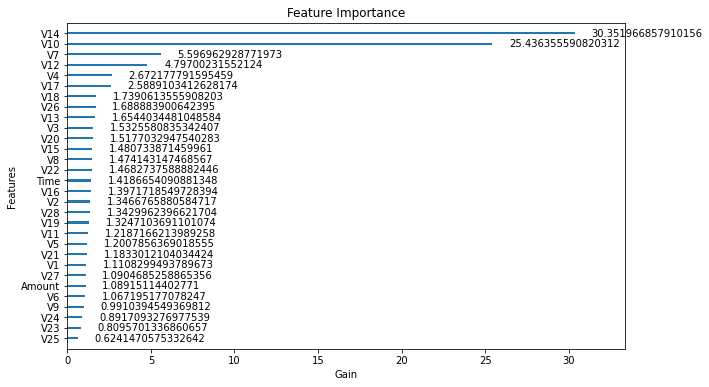

Results for ROS Feature Selection:

   Feature  Normalized Gain
14     V14         0.297259
10     V10         0.249116
7       V7         0.054815
12     V12         0.046980
4       V4         0.026171
17     V17         0.025355
18     V18         0.017032
26     V26         0.016540
13     V13         0.016203
3       V3         0.015009
20     V20         0.014864
15     V15         0.014502
8       V8         0.014437
22     V22         0.014380
0     Time         0.013894
16     V16         0.013684
2       V2         0.013189
28     V28         0.013153
19     V19         0.012974
11     V11         0.011936
5       V5         0.011760
21     V21         0.011589
1       V1         0.010879
27     V27         0.010680
29  Amount         0.010667
6       V6         0.010452
9       V9         0.009706
24     V24         0.008733
23     V23         0.007929
25     V25         0.006113
    threshold                                  Selected Features  \
0    0.297259               

In [118]:
# Seleksi fitur untuk model 1: tidak ada metode penyeimbangan data
start_time0 = time.time()
with tf.device('/GPU:0'):
    xgb_model, result_df, threshold_df, best_aucpr, best_recall, best_features, X_selected, X_val_selected, X_test_selected, df_X_selected, df_X_val_selected, df_X_test_selected, y_train = feature_selection_with_importance(
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time0 = time.time() - start_time0

fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model, ax=ax, importance_type='gain',
                    grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for ROS Feature Selection:\n")
print(threshold_df)
print(result_df)
print("Best recall:", best_recall)
print("Best aucpr:", best_aucpr)
print("Best features:", best_features)
print("Time Taken:", end_time0)

### Random Oversampling

Feature Importance (Gain):
{'Time': 91.5325927734375, 'V1': 80.04998779296875, 'V2': 34.39091491699219, 'V3': 117.97589111328125, 'V4': 623.5755615234375, 'V5': 33.665767669677734, 'V6': 108.0864486694336, 'V7': 211.7305908203125, 'V8': 205.83580017089844, 'V9': 46.22495651245117, 'V10': 149.98268127441406, 'V11': 99.78597259521484, 'V12': 328.4569091796875, 'V13': 137.46165466308594, 'V14': 4499.4140625, 'V15': 94.52997589111328, 'V16': 57.34516525268555, 'V17': 149.21961975097656, 'V18': 76.78545379638672, 'V19': 81.50283813476562, 'V20': 96.5876235961914, 'V21': 85.39603424072266, 'V22': 64.54535675048828, 'V23': 27.96036720275879, 'V24': 39.908897399902344, 'V25': 23.127931594848633, 'V26': 163.48995971679688, 'V27': 145.2346649169922, 'V28': 13.151226997375488, 'Amount': 169.2772979736328}

Normalized Feature Importance (Gain):
{'Time': 0.011361712329019924, 'V1': 0.009936405226676843, 'V2': 0.004268858448987986, 'V3': 0.014644052964900414, 'V4': 0.07740287837112789, 'V5': 0.00417

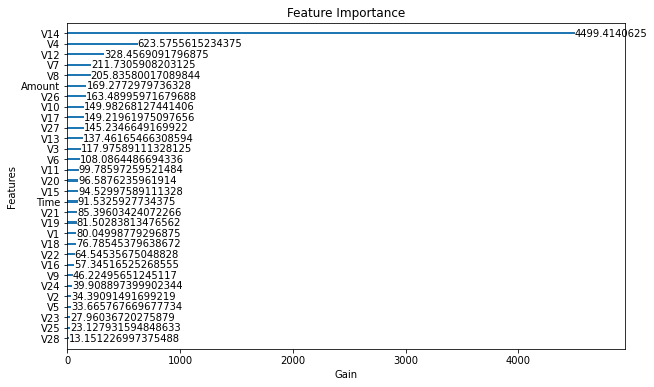

Results for ROS Feature Selection:

   Feature  Normalized Gain
14     V14         0.558501
4       V4         0.077403
12     V12         0.040771
7       V7         0.026282
8       V8         0.025550
29  Amount         0.021012
26     V26         0.020294
10     V10         0.018617
17     V17         0.018522
27     V27         0.018028
13     V13         0.017063
3       V3         0.014644
6       V6         0.013417
11     V11         0.012386
20     V20         0.011989
15     V15         0.011734
0     Time         0.011362
21     V21         0.010600
19     V19         0.010117
1       V1         0.009936
18     V18         0.009531
22     V22         0.008012
16     V16         0.007118
9       V9         0.005738
24     V24         0.004954
2       V2         0.004269
5       V5         0.004179
23     V23         0.003471
25     V25         0.002871
28     V28         0.001632
    threshold                                  Selected Features  \
0    0.558501               

In [119]:
# # Seleksi fitur untuk model 2: Random Oversampling
start_time1 = time.time()
with tf.device('/GPU:0'):
    xgb_model_ros, result_ros_df, threshold_df_ros, best_aucpr_ros, best_recall_ros, best_features_ros, X_ros_selected, X_val_ros_selected, X_test_ros_selected, df_X_ros_selected, df_X_ros_val_selected, df_X_ros_test_selected, y_ros = feature_selection_with_importance(
        X_train=X_ros,
        y_train=y_ros,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time1 = time.time() - start_time1

fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model_ros, ax=ax, importance_type='gain',
                    grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for ROS Feature Selection:\n")
print(threshold_df_ros)
print(result_ros_df)
print("Best recall:", best_recall_ros)
print("Best aucpr:", best_aucpr_ros)
print("Best features:", best_features_ros)
print("Time Taken:", end_time1)

### SMOTE

Feature Importance (Gain):
{'Time': 71.44758605957031, 'V1': 88.6320571899414, 'V2': 45.62533950805664, 'V3': 100.60816192626953, 'V4': 366.345947265625, 'V5': 70.29899597167969, 'V6': 42.343971252441406, 'V7': 92.66112518310547, 'V8': 220.2233123779297, 'V9': 43.64470672607422, 'V10': 167.91514587402344, 'V11': 76.31012725830078, 'V12': 176.99176025390625, 'V13': 90.27342987060547, 'V14': 3643.515380859375, 'V15': 49.468414306640625, 'V16': 38.578556060791016, 'V17': 84.82083892822266, 'V18': 82.71741485595703, 'V19': 57.43001937866211, 'V20': 56.27546310424805, 'V21': 72.36026000976562, 'V22': 27.99167251586914, 'V23': 54.02431869506836, 'V24': 48.75172424316406, 'V25': 35.97478103637695, 'V26': 99.18487548828125, 'V27': 38.03350830078125, 'V28': 25.329498291015625, 'Amount': 68.66275024414062}

Normalized Feature Importance (Gain):
{'Time': 0.011643163259319222, 'V1': 0.0144435602206546, 'V2': 0.007435146601191772, 'V3': 0.016395197082668594, 'V4': 0.05970006698123112, 'V5': 0.01145

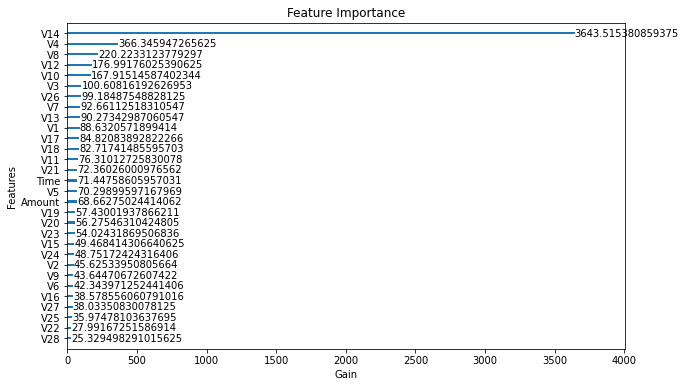

Results for SMOTE Feature Selection:

   Feature  Normalized Gain
14     V14         0.593751
4       V4         0.059700
8       V8         0.035888
12     V12         0.028843
10     V10         0.027364
3       V3         0.016395
26     V26         0.016163
7       V7         0.015100
13     V13         0.014711
1       V1         0.014444
17     V17         0.013822
18     V18         0.013480
11     V11         0.012436
21     V21         0.011792
0     Time         0.011643
5       V5         0.011456
29  Amount         0.011189
19     V19         0.009359
20     V20         0.009171
23     V23         0.008804
15     V15         0.008061
24     V24         0.007945
2       V2         0.007435
9       V9         0.007112
6       V6         0.006900
16     V16         0.006287
27     V27         0.006198
25     V25         0.005862
22     V22         0.004562
28     V28         0.004128
    threshold                                  Selected Features  \
0    0.593751             

In [120]:
# Seleksi fitur untuk model 3: smote
start_time2 = time.time()
with tf.device('/GPU:0'):
    xgb_model_smote, result_smote_df, threshold_df_smote, best_aucpr_smote, best_recall_smote, best_features_smote, X_smote_selected, X_val_smote_selected, X_test_smote_selected, df_X_smote_selected, df_X_smote_val_selected, df_X_smote_test_selected, y_smote= feature_selection_with_importance(
        X_train=X_smote,
        y_train=y_smote,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time2 = time.time() - start_time2

fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model_smote, ax=ax, importance_type='gain',
                grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for SMOTE Feature Selection:\n")
print(threshold_df_smote)
print(result_smote_df)
print("Best recall:", best_recall_smote)
print("Best aucpr:", best_aucpr_smote)
print("Best features:", best_features_smote)
print("Time Taken:", end_time2)

### ADASYN

Feature Importance (Gain):
{'Time': 107.14185333251953, 'V1': 227.72317504882812, 'V2': 114.34955596923828, 'V3': 203.6586456298828, 'V4': 716.3331298828125, 'V5': 170.76641845703125, 'V6': 87.238525390625, 'V7': 347.9000244140625, 'V8': 511.3938903808594, 'V9': 122.3783187866211, 'V10': 107.15853118896484, 'V11': 73.62139129638672, 'V12': 300.4820251464844, 'V13': 141.988525390625, 'V14': 2048.30908203125, 'V15': 90.87531280517578, 'V16': 79.55060577392578, 'V17': 205.91421508789062, 'V18': 174.56507873535156, 'V19': 68.52972412109375, 'V20': 134.90797424316406, 'V21': 85.6926498413086, 'V22': 47.976810455322266, 'V23': 62.6593017578125, 'V24': 84.29328918457031, 'V25': 61.42776107788086, 'V26': 222.81460571289062, 'V27': 94.49504852294922, 'V28': 43.568111419677734, 'Amount': 99.49314880371094}

Normalized Feature Importance (Gain):
{'Time': 0.015670413015910118, 'V1': 0.033306463303695945, 'V2': 0.016724601213147186, 'V3': 0.02978681992158977, 'V4': 0.10476985093215849, 'V5': 0.0249

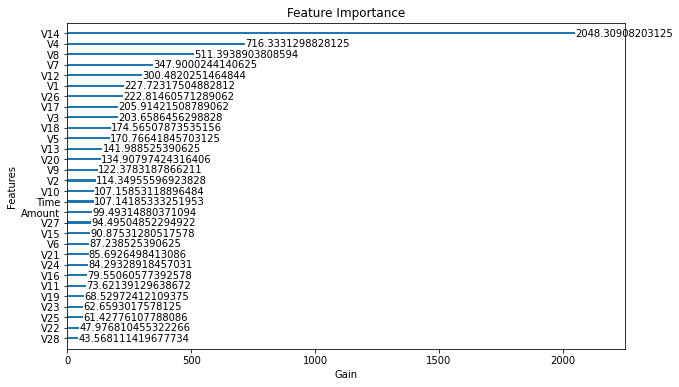

Results for ADASYN Feature Selection:

   Feature  Normalized Gain
14     V14         0.299583
4       V4         0.104770
8       V8         0.074796
7       V7         0.050883
12     V12         0.043948
1       V1         0.033306
26     V26         0.032589
17     V17         0.030117
3       V3         0.029787
18     V18         0.025532
5       V5         0.024976
13     V13         0.020767
20     V20         0.019731
9       V9         0.017899
2       V2         0.016725
10     V10         0.015673
0     Time         0.015670
29  Amount         0.014552
27     V27         0.013821
15     V15         0.013291
6       V6         0.012759
21     V21         0.012533
24     V24         0.012329
16     V16         0.011635
11     V11         0.010768
19     V19         0.010023
23     V23         0.009164
25     V25         0.008984
22     V22         0.007017
28     V28         0.006372
    threshold                                  Selected Features  \
0    0.299583            

In [121]:
# Seleksi fitur untuk model 4: adasyn
start_time3 = time.time()
with tf.device('/GPU:0'):
    xgb_model_adasyn, result_adasyn_df, threshold_df_adasyn, best_aucpr_adasyn, best_recall_adasyn, best_features_adasyn, X_adasyn_selected, X_val_adasyn_selected, X_test_adasyn_selected, df_X_adasyn_selected, df_X_adasyn_val_selected, df_X_adasyn_test_selected, y_adasyn = feature_selection_with_importance(
        X_train=X_adasyn,
        y_train=y_adasyn,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time3 = time.time() - start_time3

fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model_adasyn, ax=ax, importance_type='gain',
                grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for ADASYN Feature Selection:\n")
print(threshold_df_adasyn)
print(result_adasyn_df)
print("Best recall:", best_recall_adasyn)
print("Best aucpr:", best_aucpr_adasyn)
print("Best features:", best_features_adasyn)
print("Time Taken:", end_time3)

### Random Undersampling

Feature Importance (Gain):
{'Time': 1.0043832063674927, 'V1': 0.5064731240272522, 'V2': 1.2847797870635986, 'V3': 0.755841076374054, 'V4': 2.5872626304626465, 'V5': 0.38935819268226624, 'V6': 0.5957123637199402, 'V7': 1.5254058837890625, 'V8': 1.3207263946533203, 'V9': 1.0786058902740479, 'V10': 6.267345905303955, 'V11': 0.7927575707435608, 'V12': 3.3215415477752686, 'V13': 1.269728660583496, 'V14': 24.578208923339844, 'V15': 2.0844838619232178, 'V16': 0.8140071034431458, 'V17': 0.8840823173522949, 'V18': 0.44009673595428467, 'V19': 0.6353700160980225, 'V20': 1.0322871208190918, 'V21': 0.9326949715614319, 'V22': 0.9071049094200134, 'V23': 0.9811881184577942, 'V24': 0.13064248859882355, 'V25': 0.32381123304367065, 'V26': 1.2762691974639893, 'V27': 0.1826838254928589, 'V28': 0.6524119973182678, 'Amount': 0.73262619972229}

Normalized Feature Importance (Gain):
{'Time': 0.016940781416350786, 'V1': 0.008542606480282641, 'V2': 0.02167018863199361, 'V3': 0.012748658459415847, 'V4': 0.0436389

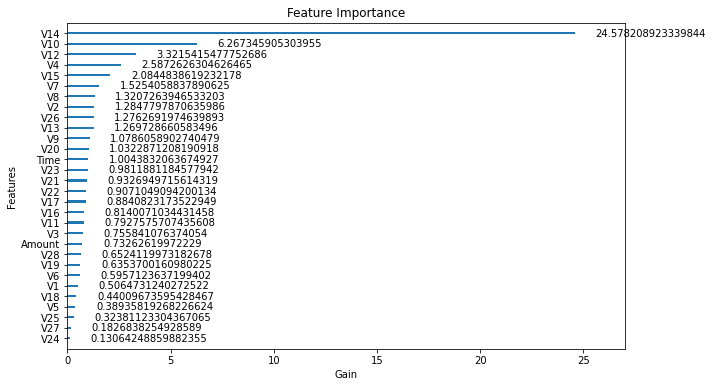

Results for RUS Feature Selection:

   Feature  Normalized Gain
14     V14         0.414557
10     V10         0.105710
12     V12         0.056024
4       V4         0.043639
15     V15         0.035159
7       V7         0.025729
8       V8         0.022276
2       V2         0.021670
26     V26         0.021527
13     V13         0.021416
9       V9         0.018193
20     V20         0.017411
0     Time         0.016941
23     V23         0.016550
21     V21         0.015732
22     V22         0.015300
17     V17         0.014912
16     V16         0.013730
11     V11         0.013371
3       V3         0.012749
29  Amount         0.012357
28     V28         0.011004
19     V19         0.010717
6       V6         0.010048
1       V1         0.008543
18     V18         0.007423
5       V5         0.006567
25     V25         0.005462
27     V27         0.003081
24     V24         0.002204
    threshold                                  Selected Features  \
0    0.414557               

In [122]:
# Seleksi fitur untuk model 5: rus
start_time4 = time.time()
with tf.device('/GPU:0'):
    xgb_model_rus, result_rus_df, threshold_df_rus, best_aucpr_rus, best_recall_rus, best_features_rus, X_rus_selected, X_val_rus_selected, X_test_rus_selected, df_X_rus_selected, df_X_rus_val_selected, df_X_rus_test_selected, y_rus = feature_selection_with_importance(
        X_train=X_rus,
        y_train=y_rus,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time4 = time.time() - start_time4

# Plot feature importance with feature names
fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model_rus, ax=ax, importance_type='gain',
                grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for RUS Feature Selection:\n")
print(threshold_df_rus)
print(result_rus_df)
print("Best recall:", best_recall_rus)
print("Best aucpr:", best_aucpr_rus)
print("Best features:", best_features_rus)
print("Time Taken:", end_time4)

### Oversampling followed by undersampling

#### 1. ROS + RUS

Feature Importance (Gain):
{'Time': 1.6684528589248657, 'V1': 2.145723819732666, 'V2': 0.9359098672866821, 'V3': 0.9563693404197693, 'V4': 4.221904754638672, 'V5': 0.6024158596992493, 'V6': 0.17168207466602325, 'V7': 4.440950870513916, 'V8': 1.8326627016067505, 'V9': 0.6550637483596802, 'V10': 7.425893306732178, 'V11': 1.442030429840088, 'V12': 3.9843578338623047, 'V13': 1.7209147214889526, 'V14': 50.50368118286133, 'V15': 1.7656813859939575, 'V16': 0.6971725225448608, 'V17': 1.2135646343231201, 'V18': 1.0910911560058594, 'V19': 2.2457048892974854, 'V20': 3.6093320846557617, 'V21': 0.5906602740287781, 'V22': 0.5677743554115295, 'V23': 0.7408483028411865, 'V24': 0.4055873155593872, 'V25': 1.6728428602218628, 'V26': 1.8062950372695923, 'V27': 0.9354651570320129, 'V28': 1.1395752429962158, 'Amount': 0.791534960269928}

Normalized Feature Importance (Gain):
{'Time': 0.016360405471643105, 'V1': 0.021040397715288466, 'V2': 0.009177283512576207, 'V3': 0.009377903670588456, 'V4': 0.04139887637

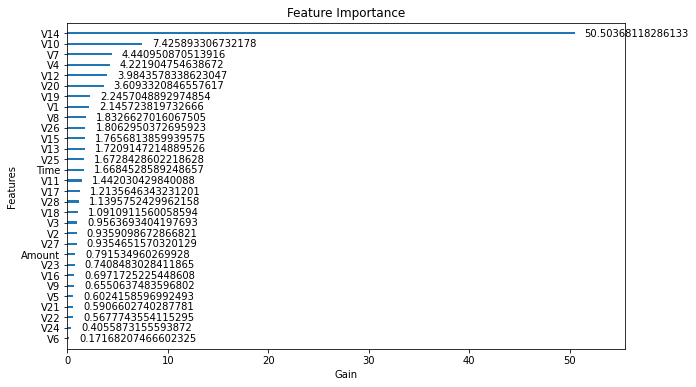

Results for ROS to RUS Feature Selection:

   Feature  Normalized Gain
14     V14         0.495226
10     V10         0.072816
7       V7         0.043547
4       V4         0.041399
12     V12         0.039070
20     V20         0.035392
19     V19         0.022021
1       V1         0.021040
8       V8         0.017971
26     V26         0.017712
15     V15         0.017314
13     V13         0.016875
25     V25         0.016403
0     Time         0.016360
11     V11         0.014140
17     V17         0.011900
28     V28         0.011174
18     V18         0.010699
3       V3         0.009378
2       V2         0.009177
27     V27         0.009173
29  Amount         0.007762
23     V23         0.007265
16     V16         0.006836
9       V9         0.006423
5       V5         0.005907
21     V21         0.005792
22     V22         0.005567
24     V24         0.003977
6       V6         0.001683
    threshold                                  Selected Features  \
0    0.495226        

In [123]:
# Seleksi fitur untuk model 6: ROS + RUS
start_time5 = time.time()
with tf.device('/GPU:0'):
    xgb_model_ros_to_rus, result_ros_to_rus_df, threshold_df_ros_to_rus, best_aucpr_ros_to_rus, best_recall_ros_to_rus, best_features_ros_to_rus, X_ros_to_rus_selected, X_val_ros_to_rus_selected, X_test_ros_to_rus_selected, df_X_ros_to_rus_selected, df_X_ros_to_rus_val_selected, df_X_ros_to_rus_test_selected, y_ros_to_rus = feature_selection_with_importance(
        X_train=X_ros_to_rus,
        y_train=y_ros_to_rus,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time5 = time.time() - start_time5

fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model_ros_to_rus, ax=ax, importance_type='gain',
                grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for ROS to RUS Feature Selection:\n")
print(threshold_df_ros_to_rus)
print(result_ros_to_rus_df)
print("Best recall:", best_recall_ros_to_rus)
print("Best aucpr:", best_aucpr_ros_to_rus)
print("Best features:", best_features_ros_to_rus)
print("Time Taken:", end_time5)

#### 2. SMOTE + RUS

Feature Importance (Gain):
{'Time': 1.5308470726013184, 'V1': 0.9092084169387817, 'V2': 0.773898184299469, 'V3': 0.790673017501831, 'V4': 4.443788051605225, 'V5': 0.730291485786438, 'V6': 0.3593131899833679, 'V7': 3.411454677581787, 'V8': 1.9586243629455566, 'V9': 0.6842573285102844, 'V10': 3.7149128913879395, 'V11': 1.4969357252120972, 'V12': 3.1758103370666504, 'V13': 1.944000482559204, 'V14': 46.726016998291016, 'V15': 1.8301278352737427, 'V16': 0.9708755016326904, 'V17': 1.446097493171692, 'V18': 1.10625422000885, 'V19': 0.6596070528030396, 'V20': 2.1636953353881836, 'V21': 0.7682958841323853, 'V22': 1.2067718505859375, 'V23': 0.14678041636943817, 'V24': 1.0030237436294556, 'V25': 0.6055991053581238, 'V26': 0.9535630941390991, 'V27': 0.6060776114463806, 'V28': 0.6240125298500061, 'Amount': 1.1947039365768433}

Normalized Feature Importance (Gain):
{'Time': 0.01740874575293798, 'V1': 0.010339490109892019, 'V2': 0.00880074631245579, 'V3': 0.00899150919889593, 'V4': 0.0505346208350402

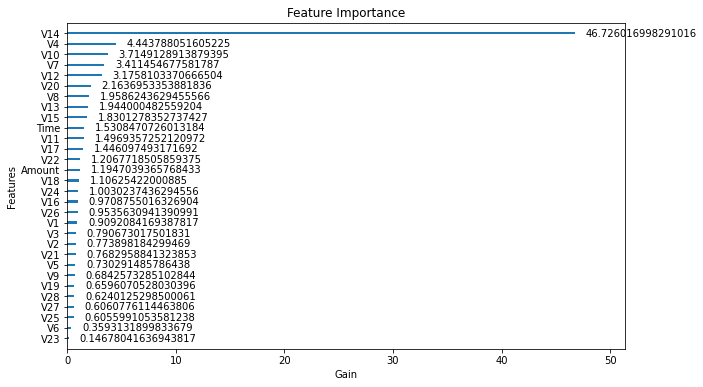

Results for SMOTE to RUS Feature Selection:

   Feature  Normalized Gain
14     V14         0.531367
4       V4         0.050535
10     V10         0.042246
7       V7         0.038795
12     V12         0.036115
20     V20         0.024605
8       V8         0.022273
13     V13         0.022107
15     V15         0.020812
0     Time         0.017409
11     V11         0.017023
17     V17         0.016445
22     V22         0.013723
29  Amount         0.013586
18     V18         0.012580
24     V24         0.011406
16     V16         0.011041
26     V26         0.010844
1       V1         0.010339
3       V3         0.008992
2       V2         0.008801
21     V21         0.008737
5       V5         0.008305
9       V9         0.007781
19     V19         0.007501
28     V28         0.007096
27     V27         0.006892
25     V25         0.006887
6       V6         0.004086
23     V23         0.001669
    threshold                                  Selected Features  \
0    0.531367      

In [124]:
# Seleksi fitur untuk model 7: SMOTE + RUS
start_time6 = time.time()
with tf.device('/GPU:0'):
    xgb_model_smote_to_rus, result_smote_to_rus_df, threshold_df_smote_to_rus, best_aucpr_smote_to_rus, best_recall_smote_to_rus, best_features_smote_to_rus, X_smote_to_rus_selected, X_val_smote_to_rus_selected, X_test_smote_to_rus_selected, df_X_smote_to_rus_selected, df_X_smote_to_rus_val_selected, df_X_smote_to_rus_test_selected, y_smote_to_rus = feature_selection_with_importance(
        X_train=X_smote_to_rus,
        y_train=y_smote_to_rus,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time6 = time.time() - start_time6

fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model_smote_to_rus, ax=ax, importance_type='gain',
                grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for SMOTE to RUS Feature Selection:\n")
print(threshold_df_smote_to_rus)
print(result_smote_to_rus_df)
print("Best recall:", best_recall_smote_to_rus)
print("Best aucpr:", best_aucpr_smote_to_rus)
print("Best features:", best_features_smote_to_rus)
print("Time Taken:", end_time6)

### Undersampling followed by oversampling

#### 3. RUS + ROS

Feature Importance (Gain):
{'Time': 65.6348876953125, 'V1': 60.24353790283203, 'V2': 26.155168533325195, 'V3': 83.81322479248047, 'V4': 389.9388427734375, 'V5': 17.328977584838867, 'V6': 32.07501220703125, 'V7': 97.79634857177734, 'V8': 124.99069213867188, 'V9': 33.6187629699707, 'V10': 144.20799255371094, 'V11': 29.50229835510254, 'V12': 245.13186645507812, 'V13': 53.30035400390625, 'V14': 2770.43115234375, 'V15': 41.08314895629883, 'V16': 38.837913513183594, 'V17': 72.00988006591797, 'V18': 37.591217041015625, 'V19': 41.98447036743164, 'V20': 58.25973892211914, 'V21': 47.02141571044922, 'V22': 57.105064392089844, 'V23': 10.662199974060059, 'V24': 10.084672927856445, 'V25': 12.181848526000977, 'V26': 84.64285278320312, 'V27': 86.26182556152344, 'V28': 14.514871597290039, 'Amount': 85.89596557617188}

Normalized Feature Importance (Gain):
{'Time': 0.013471010428430734, 'V1': 0.012364481083626064, 'V2': 0.005368129061260666, 'V3': 0.01720196171373274, 'V4': 0.08003167830248817, 'V5': 0.

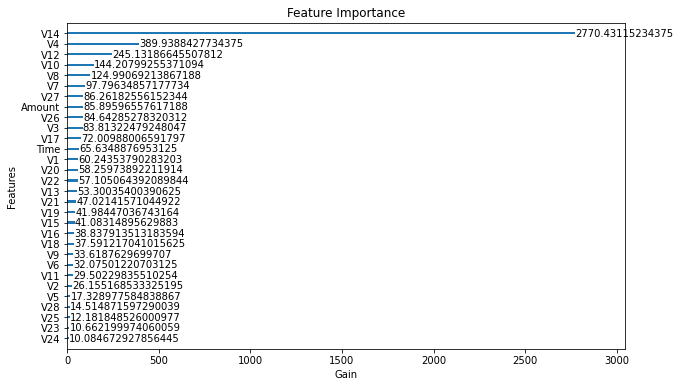

Results for RUS to ROS Feature Selection:

   Feature  Normalized Gain
14     V14         0.568608
4       V4         0.080032
12     V12         0.050311
10     V10         0.029597
8       V8         0.025653
7       V7         0.020072
27     V27         0.017705
29  Amount         0.017629
26     V26         0.017372
3       V3         0.017202
17     V17         0.014779
0     Time         0.013471
1       V1         0.012364
20     V20         0.011957
22     V22         0.011720
13     V13         0.010939
21     V21         0.009651
19     V19         0.008617
15     V15         0.008432
16     V16         0.007971
18     V18         0.007715
9       V9         0.006900
6       V6         0.006583
11     V11         0.006055
2       V2         0.005368
5       V5         0.003557
28     V28         0.002979
25     V25         0.002500
23     V23         0.002188
24     V24         0.002070
    threshold                                  Selected Features  \
0    0.568608        

In [125]:
# Seleksi fitur untuk model 8: RUS + ROS
start_time7 = time.time()
with tf.device('/GPU:0'):
    xgb_model_rus_to_ros, result_rus_to_ros_df, threshold_df_rus_to_ros, best_aucpr_rus_to_ros, best_recall_rus_to_ros, best_features_rus_to_ros, X_rus_to_ros_selected, X_val_rus_to_ros_selected, X_test_rus_to_ros_selected, df_X_rus_to_ros_selected, df_X_rus_to_ros_val_selected, df_X_rus_to_ros_test_selected, y_rus_to_ros = feature_selection_with_importance(
        X_train=X_rus_to_ros,
        y_train=y_rus_to_ros,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time7 = time.time() - start_time7

fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model_rus_to_ros, ax=ax, importance_type='gain',
                grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for RUS to ROS Feature Selection:\n")
print(threshold_df_rus_to_ros)
print(result_rus_to_ros_df)
print("Best recall:", best_recall_rus_to_ros)
print("Best aucpr:", best_aucpr_rus_to_ros)
print("Best features:", best_features_rus_to_ros)
print("Time Taken:", end_time7)

#### 4. RUS + Smote

Feature Importance (Gain):
{'Time': 34.34954833984375, 'V1': 39.527183532714844, 'V2': 29.924333572387695, 'V3': 49.22620391845703, 'V4': 182.8584747314453, 'V5': 33.917518615722656, 'V6': 23.782289505004883, 'V7': 58.00413513183594, 'V8': 160.98036193847656, 'V9': 20.106435775756836, 'V10': 79.3204574584961, 'V11': 36.44501876831055, 'V12': 128.74713134765625, 'V13': 55.18692398071289, 'V14': 1941.453369140625, 'V15': 34.79659652709961, 'V16': 12.550702095031738, 'V17': 66.10589599609375, 'V18': 50.4931640625, 'V19': 31.747323989868164, 'V20': 29.01975440979004, 'V21': 30.054719924926758, 'V22': 28.366138458251953, 'V23': 35.007911682128906, 'V24': 22.94515037536621, 'V25': 15.636771202087402, 'V26': 51.89682388305664, 'V27': 29.389333724975586, 'V28': 12.243199348449707, 'Amount': 49.269649505615234}

Normalized Feature Importance (Gain):
{'Time': 0.010182614513778929, 'V1': 0.011717477876183815, 'V2': 0.008870799415895407, 'V3': 0.014592665193704897, 'V4': 0.054206749397286605, 'V5'

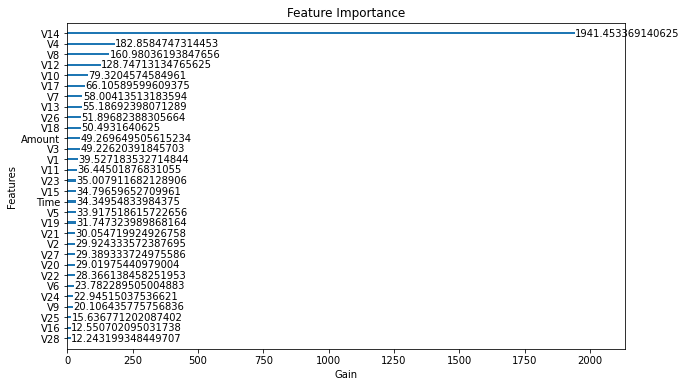

Results for RUS to SMOTE Feature Selection:

   Feature  Normalized Gain
14     V14         0.575526
4       V4         0.054207
8       V8         0.047721
12     V12         0.038166
10     V10         0.023514
17     V17         0.019596
7       V7         0.017195
13     V13         0.016360
26     V26         0.015384
18     V18         0.014968
29  Amount         0.014606
3       V3         0.014593
1       V1         0.011717
11     V11         0.010804
23     V23         0.010378
15     V15         0.010315
0     Time         0.010183
5       V5         0.010055
19     V19         0.009411
21     V21         0.008909
2       V2         0.008871
27     V27         0.008712
20     V20         0.008603
22     V22         0.008409
6       V6         0.007050
24     V24         0.006802
9       V9         0.005960
25     V25         0.004635
16     V16         0.003721
28     V28         0.003629
    threshold                                  Selected Features  \
0    0.575526      

In [126]:
# Seleksi fitur untuk model 9: SMOTE + RUS
start_time8 = time.time()
with tf.device('/GPU:0'):
    xgb_model_rus_to_smote, result_rus_to_smote_df, threshold_df_rus_to_smote, best_aucpr_rus_to_smote, best_recall_rus_to_smote, best_features_rus_to_smote, X_rus_to_smote_selected, X_val_rus_to_smote_selected, X_test_rus_to_smote_selected, df_X_rus_to_smote_selected, df_X_rus_to_smote_val_selected, df_X_rus_to_smote_test_selected, y_rus_to_smote = feature_selection_with_importance(
        X_train=X_rus_to_smote,
        y_train=y_rus_to_smote,
        X_val=X_val,
        y_val=y_val,
        X_test=X_test,
        y_test=y_test
    )
end_time8 = time.time() - start_time8

fig, ax = plt.subplots(figsize=(10, 6))
plot_importance(xgb_model_rus_to_smote, ax=ax, importance_type='gain',
                grid=False, show_values=True)
plt.xlabel('Gain')
plt.title('Feature Importance')
plt.show()

print("Results for RUS to SMOTE Feature Selection:\n")
print(threshold_df_rus_to_smote)
print(result_rus_to_smote_df)
print("Best recall:", best_recall_rus_to_smote)
print("Best aucpr:", best_aucpr_rus_to_smote)
print("Best features:", best_features_rus_to_smote)
print("Time Taken:", end_time8)

In [127]:
current_time = datetime.now()

# Mencetak waktu dalam format jam:menit:detik
print("End of feature selection")
print(current_time.strftime("%H:%M:%S"))

End of feature selection
06:31:54


## DNN Modelling

In [128]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.metrics import AUC, Recall, Precision, Metric
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

# **HYPERPARAMETER OPTIMIZATION**

## DNN HYPERPARAMETER TUNING

Reference: https://www.tensorflow.org/tutorials/keras/keras_tuner

In [129]:
current_time = datetime.now()

# Mencetak waktu dalam format jam:menit:detik
print("Starting tuning hyperparameter")
print(current_time.strftime("%H:%M:%S"))

Starting tuning hyperparameter
06:31:54


In [130]:
!pip install keras_tuner

Defaulting to user installation because normal site-packages is not writeable


In [131]:
import time
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import AUC, Recall, Precision, Metric
from sklearn.utils.class_weight import compute_class_weight

In [132]:
class F1Score(Metric):
    def __init__(self, name="f1_score", **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.tp = self.add_weight(name="tp", initializer="zeros")
        self.fp = self.add_weight(name="fp", initializer="zeros")
        self.fn = self.add_weight(name="fn", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.float32)  # Konversi y_true ke float32
        y_pred = tf.round(y_pred)  # Konversi probabilitas ke 0/1

        tp = tf.reduce_sum(y_true * y_pred)
        fp = tf.reduce_sum((1 - y_true) * y_pred)
        fn = tf.reduce_sum(y_true * (1 - y_pred))

        self.tp.assign_add(tp)
        self.fp.assign_add(fp)
        self.fn.assign_add(fn)

    def result(self):
        precision = self.tp / (self.tp + self.fp + tf.keras.backend.epsilon())
        recall = self.tp / (self.tp + self.fn + tf.keras.backend.epsilon())
        f1 = 2 * precision * recall / (precision + recall + tf.keras.backend.epsilon())
        return f1

    def reset_state(self):
        self.tp.assign(0)
        self.fp.assign(0)
        self.fn.assign(0)

# Fungsi untuk membangun model dengan Hyperparameter Tuning
def build_ann_model(hp, input_shape):
    model = Sequential()
    model.add(Input(shape=(input_shape,)))

    # Hyperparameter tuning untuk jumlah neuron di hidden layer pertama
    model.add(Dense(units=hp.Int('units_layer1', min_value=32, max_value=128), activation='relu'))

    # Hyperparameter tuning untuk jumlah neuron di hidden layer kedua
    model.add(Dense(units=hp.Int('units_layer2', min_value=16, max_value=64), activation='relu'))
    
    # Hyperparameter tuning untuk jumlah neuron di hidden layer ketiga
    model.add(Dense(units=hp.Int('units_layer3', min_value=8, max_value=64), activation='relu'))

    # Layer output
    model.add(Dense(1, activation='sigmoid'))

    # Hyperparameter tuning untuk learning rate
    learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-1, sampling='LOG')

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy', Precision(name='precision'), Recall(name='recall'), F1Score(name='f1_score'), AUC(name='aucpr', curve='PR')],
                  weighted_metrics=[])

    return model

In [133]:
input_shape = df_X_selected.shape[1]
input_shape_ros = df_X_ros_selected.shape[1]
input_shape_smote = df_X_smote_selected.shape[1]
input_shape_adasyn = df_X_adasyn_selected.shape[1]
input_shape_rus = df_X_rus_selected.shape[1]
input_shape_ros_to_rus = df_X_ros_to_rus_selected.shape[1]
input_shape_smote_to_rus = df_X_smote_to_rus_selected.shape[1]
input_shape_rus_to_ros = df_X_rus_to_ros_selected.shape[1]
input_shape_rus_to_smote = df_X_rus_to_smote_selected.shape[1]

In [134]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time1 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3, # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=42,
    directory='CCFD8/my_dir',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner.search(df_X_selected, y_train,
                 epochs=20,
                 batch_size=32,
                 validation_data=(df_X_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model = tuner.hypermodel.build(best_hps)
end_tuner1 = time.time() - tuner_time1

count00 = time.time()
with tf.device('/GPU:0'):
    # Melatih model terbaik"
    best_model.fit(df_X_selected, y_train,
                       validation_data=(df_X_val_selected, y_val),
                       epochs=20, verbose=1)
end_count00 = (time.time() - count00) + end_time0
end_count00_with_tuning = end_count00 + end_tuner1
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count00} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count00_with_tuning} sec")

best_model.save('CCFD8/nomodel_model_gain.keras')

Trial 5 Complete [00h 18m 52s]
val_recall: 0.7863247990608215

Best val_recall So Far: 0.7948718070983887
Total elapsed time: 01h 29m 37s
Best learning rate found:
Learning Rate: 0.00012232117875737863
Epoch 1/20
6409/6409 [==============================] - 19s 3ms/step - loss: 0.0281 - accuracy: 0.9963 - precision: 0.2390 - recall: 0.5183 - f1_score: 0.3271 - aucpr: 0.4509 - val_loss: 0.0054 - val_accuracy: 0.9993 - val_precision: 0.8529 - val_recall: 0.7436 - val_f1_score: 0.7945 - val_aucpr: 0.6784
Epoch 2/20
6409/6409 [==============================] - 18s 3ms/step - loss: 0.0030 - accuracy: 0.9994 - precision: 0.8683 - recall: 0.7803 - f1_score: 0.8220 - aucpr: 0.7873 - val_loss: 0.0054 - val_accuracy: 0.9993 - val_precision: 0.8529 - val_recall: 0.7436 - val_f1_score: 0.7945 - val_aucpr: 0.6857
Epoch 3/20
6409/6409 [==============================] - 18s 3ms/step - loss: 0.0027 - accuracy: 0.9994 - precision: 0.8708 - recall: 0.7972 - f1_score: 0.8324 - aucpr: 0.8254 - val_loss: 0

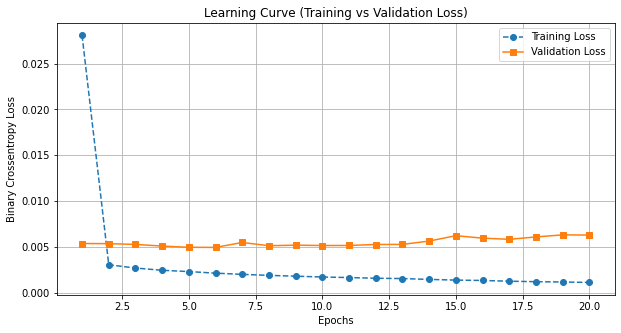

In [135]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# # Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [136]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 0
Hyperparameters: {'units_layer1': 94, 'units_layer2': 17, 'units_layer3': 31, 'learning_rate': 0.00012232117875737863}
Validation Recall: 0.7948718070983887

Trial ID: 4
Hyperparameters: {'units_layer1': 88, 'units_layer2': 26, 'units_layer3': 25, 'learning_rate': 0.0009504947970741314}
Validation Recall: 0.7863247990608215

Trial ID: 2
Hyperparameters: {'units_layer1': 80, 'units_layer2': 27, 'units_layer3': 63, 'learning_rate': 0.002941480046354757}
Validation Recall: 0.7777777910232544

Trial ID: 1
Hyperparameters: {'units_layer1': 118, 'units_layer2': 33, 'units_layer3': 39, 'learning_rate': 1.8515519652548627e-05}
Validation Recall: 0.7606837749481201

Trial ID: 3
Hyperparameters: {'units_layer1': 120, 'units_layer2': 20, 'units_layer3': 63, 'learning_rate': 1.4800038812985168e-05}
Validation Recall: 0.7606837749481201



### Random Oversampling

In [141]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time2 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner_ros = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape_ros),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3,  # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=43,
    directory='CCFD8/my_dir_ros',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner_ros.search(df_X_ros_selected, y_ros,
                 epochs=20,
                 batch_size=32,
                 validation_data=(df_X_ros_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps_ros = tuner_ros.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps_ros.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model_ros = tuner_ros.hypermodel.build(best_hps_ros)
end_tuner2 = time.time() - tuner_time2

count9 = time.time()
with tf.device('/GPU:0'):
    best_model_ros.fit(df_X_ros_selected, y_ros,
                       validation_data=(df_X_ros_val_selected, y_val),
                       epochs=20, verbose=1)
end_count9 = (time.time() - count9) + end_time1
end_count9_with_tuning = end_count9 + end_tuner2
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count9} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count9_with_tuning} sec")

best_model_ros.save('CCFD8/randomoversampling_model_gain.keras')

Trial 5 Complete [00h 35m 42s]
val_recall: 0.8461538553237915

Best val_recall So Far: 0.8547008633613586
Total elapsed time: 02h 58m 25s
Best learning rate found:
Learning Rate: 0.002103917275801273
Epoch 1/20
12795/12795 [==============================] - 35s 3ms/step - loss: 0.2124 - accuracy: 0.9193 - precision: 0.9616 - recall: 0.8734 - f1_score: 0.9154 - aucpr: 0.9719 - val_loss: 0.1697 - val_accuracy: 0.9602 - val_precision: 0.0354 - val_recall: 0.8462 - val_f1_score: 0.0679 - val_aucpr: 0.4494
Epoch 2/20
12795/12795 [==============================] - 35s 3ms/step - loss: 0.2045 - accuracy: 0.9199 - precision: 0.9633 - recall: 0.8730 - f1_score: 0.9159 - aucpr: 0.9741 - val_loss: 0.1363 - val_accuracy: 0.9691 - val_precision: 0.0451 - val_recall: 0.8462 - val_f1_score: 0.0857 - val_aucpr: 0.5233
Epoch 3/20
12795/12795 [==============================] - 35s 3ms/step - loss: 0.2005 - accuracy: 0.9200 - precision: 0.9612 - recall: 0.8754 - f1_score: 0.9163 - aucpr: 0.9753 - val_los

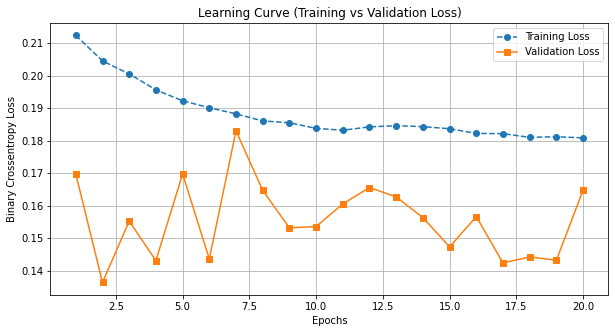

In [142]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model_ros.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# # Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [143]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner_ros.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 3
Hyperparameters: {'units_layer1': 40, 'units_layer2': 63, 'units_layer3': 10, 'learning_rate': 0.002103917275801273}
Validation Recall: 0.8547008633613586

Trial ID: 0
Hyperparameters: {'units_layer1': 35, 'units_layer2': 36, 'units_layer3': 23, 'learning_rate': 0.035733232555873684}
Validation Recall: 0.8461538553237915

Trial ID: 1
Hyperparameters: {'units_layer1': 66, 'units_layer2': 42, 'units_layer3': 11, 'learning_rate': 0.0009775664203574934}
Validation Recall: 0.8461538553237915

Trial ID: 2
Hyperparameters: {'units_layer1': 55, 'units_layer2': 63, 'units_layer3': 43, 'learning_rate': 0.04514107426881946}
Validation Recall: 0.8461538553237915

Trial ID: 4
Hyperparameters: {'units_layer1': 53, 'units_layer2': 31, 'units_layer3': 36, 'learning_rate': 0.05151886225891427}
Validation Recall: 0.8461538553237915



### Smote

In [144]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time3 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner_smote = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape_smote),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3,  # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=44,
    directory='CCFD8/my_dir_smote',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner_smote.search(df_X_smote_selected, y_smote,
                   epochs=20,
                   batch_size=32,
                   validation_data=(df_X_smote_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps_smote = tuner_smote.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps_smote.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model_smote = tuner_smote.hypermodel.build(best_hps_smote)
end_tuner3 = time.time() - tuner_time3

count10 = time.time()
with tf.device('/GPU:0'):
    best_model_smote.fit(df_X_smote_selected, y_smote,
                         validation_data=(df_X_smote_val_selected, y_val),
                         epochs=20, verbose=1)
end_count10 = (time.time() - count10) + end_time2
end_count10_with_tuning = end_count10 + end_tuner3
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count10} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count10_with_tuning} sec")

best_model_smote.save('CCFD8/smote_model_gain.keras')

Trial 5 Complete [00h 36m 02s]
val_recall: 0.8461538553237915

Best val_recall So Far: 0.8461538553237915
Total elapsed time: 02h 59m 33s
Best learning rate found:
Learning Rate: 0.0006033327505222818
Epoch 1/20
12795/12795 [==============================] - 37s 3ms/step - loss: 0.0934 - accuracy: 0.9621 - precision: 0.9664 - recall: 0.9575 - f1_score: 0.9619 - aucpr: 0.9946 - val_loss: 0.0609 - val_accuracy: 0.9774 - val_precision: 0.0594 - val_recall: 0.8205 - val_f1_score: 0.1107 - val_aucpr: 0.6248
Epoch 2/20
12795/12795 [==============================] - 35s 3ms/step - loss: 0.0658 - accuracy: 0.9733 - precision: 0.9725 - recall: 0.9741 - f1_score: 0.9733 - aucpr: 0.9971 - val_loss: 0.0817 - val_accuracy: 0.9689 - val_precision: 0.0436 - val_recall: 0.8205 - val_f1_score: 0.0828 - val_aucpr: 0.5689
Epoch 3/20
12795/12795 [==============================] - 36s 3ms/step - loss: 0.0566 - accuracy: 0.9773 - precision: 0.9758 - recall: 0.9789 - f1_score: 0.9773 - aucpr: 0.9976 - val_lo

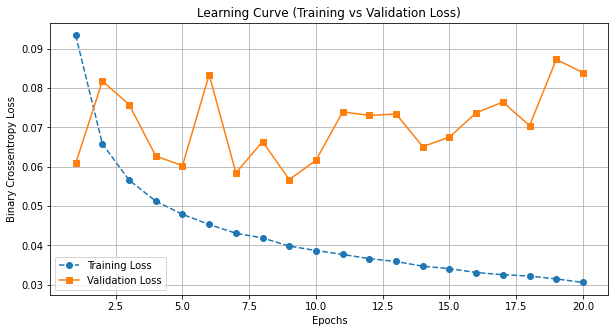

In [145]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model_smote.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# # Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [146]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner_smote.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 4
Hyperparameters: {'units_layer1': 61, 'units_layer2': 40, 'units_layer3': 60, 'learning_rate': 0.0006033327505222818}
Validation Recall: 0.8461538553237915

Trial ID: 0
Hyperparameters: {'units_layer1': 71, 'units_layer2': 29, 'units_layer3': 58, 'learning_rate': 0.0002554965400757683}
Validation Recall: 0.8376068472862244

Trial ID: 2
Hyperparameters: {'units_layer1': 126, 'units_layer2': 46, 'units_layer3': 60, 'learning_rate': 2.2980497006447554e-05}
Validation Recall: 0.8376068472862244

Trial ID: 3
Hyperparameters: {'units_layer1': 125, 'units_layer2': 18, 'units_layer3': 41, 'learning_rate': 7.883914384218181e-05}
Validation Recall: 0.8376068472862244

Trial ID: 1
Hyperparameters: {'units_layer1': 85, 'units_layer2': 19, 'units_layer3': 36, 'learning_rate': 9.420437028305497e-05}
Validation Recall: 0.8290598392486572



### Adasyn

In [147]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time4 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner_adasyn = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape_adasyn),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3,  # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=45,
    directory='CCFD8/my_dir_adasyn',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner_adasyn.search(df_X_adasyn_selected, y_adasyn,
                   epochs=20,
                   batch_size=32,
                   validation_data=(df_X_adasyn_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps_adasyn = tuner_adasyn.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps_adasyn.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model_adasyn = tuner_adasyn.hypermodel.build(best_hps_adasyn)
end_tuner4 = time.time() - tuner_time4

count11 = time.time()
with tf.device('/GPU:0'):
    best_model_adasyn.fit(df_X_adasyn_selected, y_adasyn,
                         validation_data=(df_X_adasyn_val_selected, y_val),
                         epochs=20, verbose=1)
end_count11 = (time.time() - count11) + end_time3
end_count11_with_tuning = end_count11 + end_tuner4
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count11} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count11_with_tuning} sec")

best_model_adasyn.save('CCFD8/adasyn_model_gain.keras')

Trial 5 Complete [00h 32m 08s]
val_recall: 0.8717948794364929

Best val_recall So Far: 0.9658119678497314
Total elapsed time: 02h 53m 59s
Best learning rate found:
Learning Rate: 0.07305950948976508
Epoch 1/20
12794/12794 [==============================] - 32s 2ms/step - loss: 0.4985 - accuracy: 0.7788 - precision: 0.8629 - recall: 0.6629 - f1_score: 0.7498 - aucpr: 0.8413 - val_loss: 0.5456 - val_accuracy: 0.7893 - val_precision: 0.0070 - val_recall: 0.8718 - val_f1_score: 0.0140 - val_aucpr: 0.0065
Epoch 2/20
12794/12794 [==============================] - 31s 2ms/step - loss: 0.5263 - accuracy: 0.7527 - precision: 0.8099 - recall: 0.6605 - f1_score: 0.7276 - aucpr: 0.8217 - val_loss: 0.4040 - val_accuracy: 0.9472 - val_precision: 0.0268 - val_recall: 0.8462 - val_f1_score: 0.0520 - val_aucpr: 0.0235
Epoch 3/20
12794/12794 [==============================] - 31s 2ms/step - loss: 0.6885 - accuracy: 0.5104 - precision: 0.5104 - recall: 0.5094 - f1_score: 0.5099 - aucpr: 0.5295 - val_loss

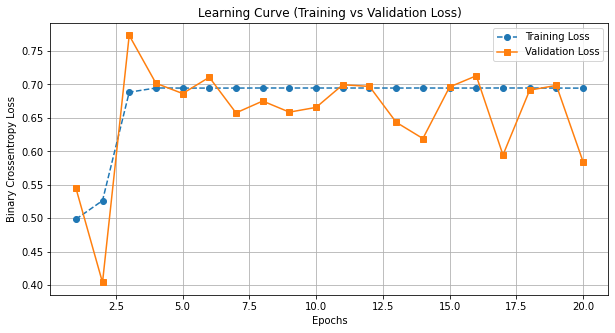

In [148]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model_adasyn.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# # Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [149]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner_adasyn.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 2
Hyperparameters: {'units_layer1': 91, 'units_layer2': 60, 'units_layer3': 13, 'learning_rate': 0.07305950948976508}
Validation Recall: 0.9658119678497314

Trial ID: 1
Hyperparameters: {'units_layer1': 38, 'units_layer2': 40, 'units_layer3': 21, 'learning_rate': 0.0819255627939509}
Validation Recall: 0.9230769276618958

Trial ID: 0
Hyperparameters: {'units_layer1': 58, 'units_layer2': 59, 'units_layer3': 28, 'learning_rate': 0.00155822911114866}
Validation Recall: 0.8717948794364929

Trial ID: 3
Hyperparameters: {'units_layer1': 36, 'units_layer2': 44, 'units_layer3': 20, 'learning_rate': 0.00017030485110152736}
Validation Recall: 0.8717948794364929

Trial ID: 4
Hyperparameters: {'units_layer1': 79, 'units_layer2': 61, 'units_layer3': 33, 'learning_rate': 0.0008028474807082748}
Validation Recall: 0.8717948794364929



### Random Undersampling

In [150]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time5 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner_rus = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape_rus),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3,  # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=46,
    directory='CCFD8/my_dir_rus',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner_rus.search(df_X_rus_selected, y_rus,
                 epochs=20,
                 batch_size=32,
                 validation_data=(df_X_rus_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps_rus = tuner_rus.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps_rus.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model_rus = tuner_rus.hypermodel.build(best_hps_rus)
end_tuner5 = time.time() - tuner_time5

count12 = time.time()
with tf.device('/GPU:0'):
    best_model_rus.fit(df_X_rus_selected, y_rus,
                       validation_data=(df_X_rus_val_selected, y_val),
                       epochs=20, verbose=1)
end_count12 = (time.time() - count12) + end_time4
end_count12_with_tuning = end_count12 + end_tuner5
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count12} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count12_with_tuning} sec")

best_model_rus.save('CCFD8/randomundersampling_model_gain.keras')

Trial 5 Complete [00h 01m 19s]
val_recall: 0.8803418874740601

Best val_recall So Far: 1.0
Total elapsed time: 00h 06m 36s
Best learning rate found:
Learning Rate: 1.8515519652548627e-05
Epoch 1/20
23/23 [==============================] - 2s 57ms/step - loss: 1.0488 - accuracy: 0.3732 - precision: 0.0982 - recall: 0.0310 - f1_score: 0.0471 - aucpr: 0.3263 - val_loss: 0.6570 - val_accuracy: 0.7242 - val_precision: 4.8000e-04 - val_recall: 0.0769 - val_f1_score: 9.5405e-04 - val_aucpr: 0.0027
Epoch 2/20
23/23 [==============================] - 1s 50ms/step - loss: 0.9860 - accuracy: 0.3690 - precision: 0.1157 - recall: 0.0394 - f1_score: 0.0588 - aucpr: 0.3364 - val_loss: 0.6597 - val_accuracy: 0.7101 - val_precision: 4.5648e-04 - val_recall: 0.0769 - val_f1_score: 9.0758e-04 - val_aucpr: 0.0024
Epoch 3/20
23/23 [==============================] - 1s 50ms/step - loss: 0.9294 - accuracy: 0.3676 - precision: 0.1148 - recall: 0.0394 - f1_score: 0.0587 - aucpr: 0.3385 - val_loss: 0.6621 - val

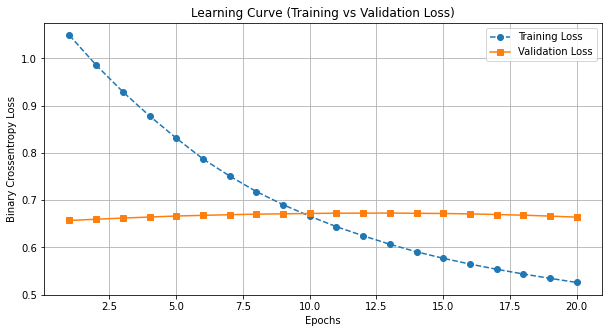

In [151]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model_rus.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# # Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [152]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner_rus.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 0
Hyperparameters: {'units_layer1': 118, 'units_layer2': 33, 'units_layer3': 39, 'learning_rate': 1.8515519652548627e-05}
Validation Recall: 1.0

Trial ID: 3
Hyperparameters: {'units_layer1': 88, 'units_layer2': 26, 'units_layer3': 25, 'learning_rate': 0.0009504947970741314}
Validation Recall: 0.8803418874740601

Trial ID: 4
Hyperparameters: {'units_layer1': 122, 'units_layer2': 37, 'units_layer3': 35, 'learning_rate': 0.0004560117122127547}
Validation Recall: 0.8803418874740601

Trial ID: 1
Hyperparameters: {'units_layer1': 80, 'units_layer2': 27, 'units_layer3': 63, 'learning_rate': 0.002941480046354757}
Validation Recall: 0.8376068472862244

Trial ID: 2
Hyperparameters: {'units_layer1': 120, 'units_layer2': 20, 'units_layer3': 63, 'learning_rate': 1.4800038812985168e-05}
Validation Recall: 0.8376068472862244



### Oversampling followed by undersampling

#### ROS + RUS

In [153]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time6 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner_ros_to_rus = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape_ros_to_rus),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3,  # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=47,
    directory='CCFD8/my_dir_ros_to_rus',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner_ros_to_rus.search(df_X_ros_to_rus_selected, y_ros_to_rus,
                         epochs=20,
                         batch_size=32,
                         validation_data=(df_X_ros_to_rus_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps_ros_to_rus = tuner_ros_to_rus.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps_ros_to_rus.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model_ros_to_rus = tuner_ros_to_rus.hypermodel.build(best_hps_ros_to_rus)
end_tuner6 = time.time() - tuner_time6

count13 = time.time()
with tf.device('/GPU:0'):
    best_model_ros_to_rus.fit(df_X_ros_to_rus_selected, y_ros_to_rus,
                               validation_data=(df_X_ros_to_rus_val_selected, y_val),
                               epochs=20, verbose=1)
end_count13 = (time.time() - count13) + end_time5
end_count13_with_tuning = end_count13 + end_tuner6
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count13} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count13_with_tuning} sec")

best_model_ros_to_rus.save('CCFD8/ros_to_rus_model_gain.keras')

Trial 5 Complete [00h 01m 23s]
val_recall: 0.811965823173523

Best val_recall So Far: 0.9316239356994629
Total elapsed time: 00h 06m 52s
Best learning rate found:
Learning Rate: 0.04514107426881946
Epoch 1/20
45/45 [==============================] - 2s 30ms/step - loss: 0.1982 - accuracy: 0.9355 - precision: 0.9377 - recall: 0.9324 - f1_score: 0.9350 - aucpr: 0.9801 - val_loss: 0.1497 - val_accuracy: 0.9489 - val_precision: 0.0277 - val_recall: 0.8462 - val_f1_score: 0.0536 - val_aucpr: 0.4124
Epoch 2/20
45/45 [==============================] - 1s 26ms/step - loss: 0.6396 - accuracy: 0.9446 - precision: 0.9606 - recall: 0.9268 - f1_score: 0.9434 - aucpr: 0.9842 - val_loss: 0.3463 - val_accuracy: 0.9584 - val_precision: 0.0338 - val_recall: 0.8462 - val_f1_score: 0.0651 - val_aucpr: 0.1531
Epoch 3/20
45/45 [==============================] - 1s 26ms/step - loss: 0.1887 - accuracy: 0.9460 - precision: 0.9675 - recall: 0.9225 - f1_score: 0.9445 - aucpr: 0.9826 - val_loss: 0.7576 - val_accu

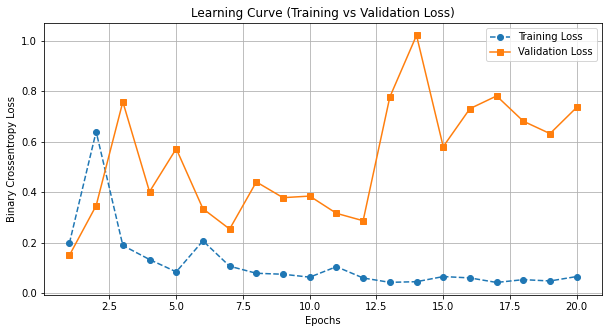

In [154]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model_ros_to_rus.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# # Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [155]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner_ros_to_rus.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 1
Hyperparameters: {'units_layer1': 55, 'units_layer2': 63, 'units_layer3': 43, 'learning_rate': 0.04514107426881946}
Validation Recall: 0.9316239356994629

Trial ID: 3
Hyperparameters: {'units_layer1': 53, 'units_layer2': 31, 'units_layer3': 36, 'learning_rate': 0.05151886225891427}
Validation Recall: 0.8888888955116272

Trial ID: 2
Hyperparameters: {'units_layer1': 40, 'units_layer2': 63, 'units_layer3': 10, 'learning_rate': 0.002103917275801273}
Validation Recall: 0.8717948794364929

Trial ID: 0
Hyperparameters: {'units_layer1': 66, 'units_layer2': 42, 'units_layer3': 11, 'learning_rate': 0.0009775664203574934}
Validation Recall: 0.8290598392486572

Trial ID: 4
Hyperparameters: {'units_layer1': 75, 'units_layer2': 39, 'units_layer3': 31, 'learning_rate': 1.919710358262862e-05}
Validation Recall: 0.811965823173523



#### Smote + RUS

In [156]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time7 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner_smote_to_rus = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape_smote_to_rus),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3,  # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=48,
    directory='CCFD8/my_dir_smote_to_rus',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner_smote_to_rus.search(df_X_smote_to_rus_selected, y_smote_to_rus,
                           epochs=20,
                           batch_size=32,
                           validation_data=(df_X_smote_to_rus_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps_smote_to_rus = tuner_smote_to_rus.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps_smote_to_rus.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model_smote_to_rus = tuner_smote_to_rus.hypermodel.build(best_hps_smote_to_rus)
end_tuner7 = time.time() - tuner_time7

count14 = time.time()
with tf.device('/GPU:0'):
    best_model_smote_to_rus.fit(df_X_smote_to_rus_selected, y_smote_to_rus,
                                 validation_data=(df_X_smote_to_rus_val_selected, y_val),
                                 epochs=20, verbose=1)
end_count14 = (time.time() - count14) + end_time6
end_count14_with_tuning = end_count14 + end_tuner7
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count14} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count14_with_tuning} sec")

best_model_smote_to_rus.save('CCFD8/smote_to_rus_model_gain.keras')

Trial 5 Complete [00h 01m 23s]
val_recall: 1.0

Best val_recall So Far: 1.0
Total elapsed time: 00h 06m 53s
Best learning rate found:
Learning Rate: 1.991475773272288e-05
Epoch 1/20
45/45 [==============================] - 2s 29ms/step - loss: 2.6459 - accuracy: 0.4674 - precision: 0.1951 - recall: 0.0225 - f1_score: 0.0404 - aucpr: 0.3159 - val_loss: 0.5787 - val_accuracy: 0.9142 - val_precision: 5.2110e-04 - val_recall: 0.0256 - val_f1_score: 0.0010 - val_aucpr: 9.1607e-04
Epoch 2/20
45/45 [==============================] - 1s 26ms/step - loss: 2.4304 - accuracy: 0.4639 - precision: 0.1839 - recall: 0.0225 - f1_score: 0.0402 - aucpr: 0.3168 - val_loss: 0.5877 - val_accuracy: 0.8991 - val_precision: 4.4189e-04 - val_recall: 0.0256 - val_f1_score: 8.6881e-04 - val_aucpr: 9.7222e-04
Epoch 3/20
45/45 [==============================] - 1s 26ms/step - loss: 2.2032 - accuracy: 0.4562 - precision: 0.1765 - recall: 0.0254 - f1_score: 0.0443 - aucpr: 0.3178 - val_loss: 0.5975 - val_accuracy: 0

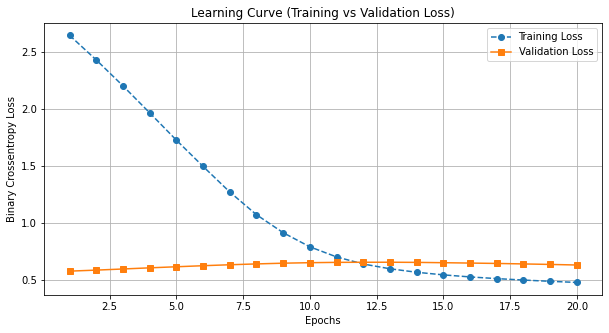

In [157]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model_smote_to_rus.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# # Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [158]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner_smote_to_rus.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 4
Hyperparameters: {'units_layer1': 78, 'units_layer2': 36, 'units_layer3': 12, 'learning_rate': 1.991475773272288e-05}
Validation Recall: 1.0

Trial ID: 1
Hyperparameters: {'units_layer1': 126, 'units_layer2': 46, 'units_layer3': 60, 'learning_rate': 2.2980497006447554e-05}
Validation Recall: 0.9059829115867615

Trial ID: 2
Hyperparameters: {'units_layer1': 125, 'units_layer2': 18, 'units_layer3': 41, 'learning_rate': 7.883914384218181e-05}
Validation Recall: 0.8888888955116272

Trial ID: 0
Hyperparameters: {'units_layer1': 85, 'units_layer2': 19, 'units_layer3': 36, 'learning_rate': 9.420437028305497e-05}
Validation Recall: 0.8803418874740601

Trial ID: 3
Hyperparameters: {'units_layer1': 61, 'units_layer2': 40, 'units_layer3': 60, 'learning_rate': 0.0006033327505222818}
Validation Recall: 0.8376068472862244



### Undersampling followed by oversampling

#### RUS + ROS

In [159]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time8 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner_rus_to_ros = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape_rus_to_ros),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3,  # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=49,
    directory='CCFD8/my_dir_rus_to_ros',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner_rus_to_ros.search(df_X_rus_to_ros_selected, y_rus_to_ros,
                           epochs=20,
                           batch_size=32,
                           validation_data=(df_X_rus_to_ros_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps_rus_to_ros = tuner_rus_to_ros.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps_rus_to_ros.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model_rus_to_ros = tuner_rus_to_ros.hypermodel.build(best_hps_rus_to_ros)
end_tuner8 = time.time() - tuner_time8

count15 = time.time()
with tf.device('/GPU:0'):
    best_model_rus_to_ros.fit(df_X_rus_to_ros_selected, y_rus_to_ros,
                                 validation_data=(df_X_rus_to_ros_val_selected, y_val),
                                 epochs=20, verbose=1)
end_count15 = (time.time() - count15) + end_time7
end_count15_with_tuning = end_count15 + end_tuner8
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count15} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count15_with_tuning} sec")

best_model_rus_to_ros.save('CCFD8/rus_to_ros_model_gain.keras')

Trial 5 Complete [00h 16m 38s]
val_recall: 0.8205128312110901

Best val_recall So Far: 0.94017094373703
Total elapsed time: 01h 23m 11s
Best learning rate found:
Learning Rate: 0.0819255627939509
Epoch 1/20
6372/6372 [==============================] - 17s 3ms/step - loss: 0.2923 - accuracy: 0.9135 - precision: 0.9202 - recall: 0.9048 - f1_score: 0.9125 - aucpr: 0.9554 - val_loss: 0.2756 - val_accuracy: 0.9763 - val_precision: 0.0518 - val_recall: 0.7436 - val_f1_score: 0.0968 - val_aucpr: 0.0409
Epoch 2/20
6372/6372 [==============================] - 16s 3ms/step - loss: 0.2487 - accuracy: 0.8998 - precision: 0.9666 - recall: 0.8275 - f1_score: 0.8916 - aucpr: 0.9603 - val_loss: 0.4107 - val_accuracy: 0.9983 - val_precision: 0.5091 - val_recall: 0.7179 - val_f1_score: 0.5957 - val_aucpr: 0.3755
Epoch 3/20
6372/6372 [==============================] - 16s 3ms/step - loss: 0.2991 - accuracy: 0.8328 - precision: 0.8874 - recall: 0.7609 - f1_score: 0.8193 - aucpr: 0.9346 - val_loss: 0.7117 

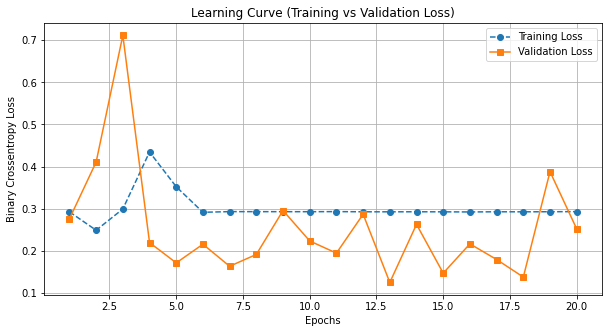

In [160]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model_rus_to_ros.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [161]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner_rus_to_ros.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 0
Hyperparameters: {'units_layer1': 38, 'units_layer2': 40, 'units_layer3': 21, 'learning_rate': 0.0819255627939509}
Validation Recall: 0.94017094373703

Trial ID: 1
Hyperparameters: {'units_layer1': 91, 'units_layer2': 60, 'units_layer3': 13, 'learning_rate': 0.07305950948976508}
Validation Recall: 0.9316239356994629

Trial ID: 2
Hyperparameters: {'units_layer1': 36, 'units_layer2': 44, 'units_layer3': 20, 'learning_rate': 0.00017030485110152736}
Validation Recall: 0.8205128312110901

Trial ID: 4
Hyperparameters: {'units_layer1': 72, 'units_layer2': 19, 'units_layer3': 12, 'learning_rate': 0.009261380821587763}
Validation Recall: 0.8205128312110901

Trial ID: 3
Hyperparameters: {'units_layer1': 79, 'units_layer2': 61, 'units_layer3': 33, 'learning_rate': 0.0008028474807082748}
Validation Recall: 0.8034188151359558



#### RUS + Smote

In [162]:
from sklearn.metrics import auc, precision_recall_curve

tuner_time9 = time.time()
# Inisialisasi tuner dengan RandomSearch hanya untuk learning rate
tuner_rus_to_smote = kt.RandomSearch(
    lambda hp: build_ann_model(hp, input_shape_rus_to_smote),  # Model dengan hanya tuning learning rate
    objective=kt.Objective("val_recall", direction="max"),  # Mencari nilai AUC-PR tertinggi
    max_trials=5,  # Mencoba 5 kombinasi parameter
    executions_per_trial=3,  # Setiap percobaan dieksekusi 3 kali untuk hasil yang lebih stabil
    seed=50,
    directory='CCFD8/my_dir_rus_to_smote',  # Folder penyimpanan hasil tuning
    project_name='dnn_learning_rate_tuning'
)

# Memulai pencarian learning rate terbaik
tuner_rus_to_smote.search(df_X_rus_to_smote_selected, y_rus_to_smote,
                           epochs=20,
                           batch_size=32,
                           validation_data=(df_X_rus_to_smote_val_selected, y_val))

# Mendapatkan hasil hyperparameter terbaik
best_hps_rus_to_smote = tuner_rus_to_smote.get_best_hyperparameters(num_trials=1)[0]

# Mencetak learning rate terbaik yang ditemukan
print("Best learning rate found:")
print(f"Learning Rate: {best_hps_rus_to_smote.get('learning_rate')}")

# Membangun model terbaik dengan learning rate terbaik
best_model_rus_to_smote = tuner_rus_to_smote.hypermodel.build(best_hps_rus_to_smote)
end_tuner9 = time.time() - tuner_time9

count16 = time.time()
with tf.device('/GPU:0'):
    best_model_rus_to_smote.fit(df_X_rus_to_smote_selected, y_rus_to_smote,
                                 validation_data=(df_X_rus_to_smote_val_selected, y_val),
                                 epochs=20, verbose=1)
end_count16 = (time.time() - count16) + end_time8
end_count16_with_tuning = end_count16 + end_tuner9
print(f"\nWaktu komputasi tanpa hyperparameter tuning: {end_count16} sec")
print(f"\nWaktu komputasi dengan hyperparameter tuning: {end_count16_with_tuning} sec")

best_model_rus_to_smote.save('CCFD8/rus_to_smote_model_gain.keras')

Trial 5 Complete [00h 16m 40s]
val_recall: 0.8290598392486572

Best val_recall So Far: 0.8290598392486572
Total elapsed time: 01h 23m 15s
Best learning rate found:
Learning Rate: 0.005457123842389516
Epoch 1/20
6372/6372 [==============================] - 17s 3ms/step - loss: 0.0237 - accuracy: 0.9929 - precision: 0.9911 - recall: 0.9946 - f1_score: 0.9929 - aucpr: 0.9989 - val_loss: 0.0266 - val_accuracy: 0.9941 - val_precision: 0.2013 - val_recall: 0.8205 - val_f1_score: 0.3232 - val_aucpr: 0.6406
Epoch 2/20
6372/6372 [==============================] - 16s 3ms/step - loss: 0.0106 - accuracy: 0.9977 - precision: 0.9966 - recall: 0.9987 - f1_score: 0.9977 - aucpr: 0.9993 - val_loss: 0.0345 - val_accuracy: 0.9976 - val_precision: 0.4000 - val_recall: 0.8205 - val_f1_score: 0.5378 - val_aucpr: 0.6104
Epoch 3/20
6372/6372 [==============================] - 16s 3ms/step - loss: 0.0077 - accuracy: 0.9983 - precision: 0.9975 - recall: 0.9991 - f1_score: 0.9983 - aucpr: 0.9995 - val_loss: 0.0

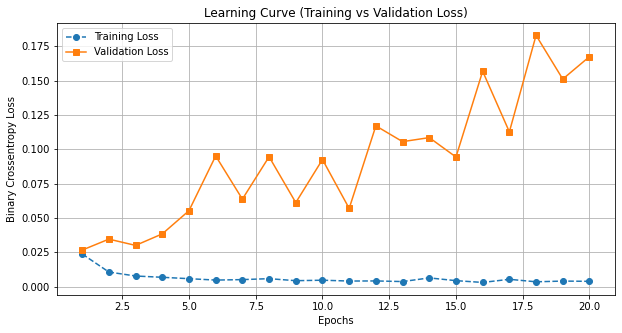

In [163]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve

# 1. Learning Curve (Training vs Validation Loss)
history = best_model_rus_to_smote.history.history

plt.figure(figsize=(10, 5))
epochs = range(1, len(history['loss']) + 1)

# Plot training loss
plt.plot(epochs, history['loss'], label='Training Loss', linestyle='--', marker='o')

# Plot validation loss (if exists)
val_loss = history.get('val_loss', [])
if val_loss:
    plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-', marker='s')

# # Menambahkan label nilai loss pada titik-titik tertentu
# for epoch, loss in zip(epochs, history['loss']):
#     plt.text(epoch, loss, f'{loss:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# if val_loss:
#     for epoch, val in zip(epochs, val_loss):
#         plt.text(epoch, val, f'{val:.4f}', fontsize=8, verticalalignment='bottom', horizontalalignment='right')

# Menambahkan label, judul, dan grid
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Learning Curve (Training vs Validation Loss)')
plt.legend()
plt.grid()
plt.show()

In [164]:
# Menampilkan semua kombinasi hyperparameters yang diuji
trials = tuner_rus_to_smote.oracle.get_best_trials(num_trials=5)  # Menampilkan 5 percobaan terbaik

for trial in trials:
    print(f"Trial ID: {trial.trial_id}")
    print(f"Hyperparameters: {trial.hyperparameters.values}")
    print(f"Validation Recall: {trial.score}\n")

Trial ID: 4
Hyperparameters: {'units_layer1': 38, 'units_layer2': 19, 'units_layer3': 50, 'learning_rate': 0.005457123842389516}
Validation Recall: 0.8290598392486572

Trial ID: 0
Hyperparameters: {'units_layer1': 80, 'units_layer2': 27, 'units_layer3': 63, 'learning_rate': 0.002941480046354757}
Validation Recall: 0.8205128312110901

Trial ID: 1
Hyperparameters: {'units_layer1': 120, 'units_layer2': 20, 'units_layer3': 63, 'learning_rate': 1.4800038812985168e-05}
Validation Recall: 0.8205128312110901

Trial ID: 2
Hyperparameters: {'units_layer1': 88, 'units_layer2': 26, 'units_layer3': 25, 'learning_rate': 0.0009504947970741314}
Validation Recall: 0.8205128312110901

Trial ID: 3
Hyperparameters: {'units_layer1': 122, 'units_layer2': 37, 'units_layer3': 35, 'learning_rate': 0.0004560117122127547}
Validation Recall: 0.8205128312110901



In [165]:
current_time = datetime.now()

# Mencetak waktu dalam format jam:menit:detik
print("End of tuning hyperparameter")
print(current_time.strftime("%H:%M:%S"))

End of tuning hyperparameter
01:01:55


# Testing

In [166]:
current_time = datetime.now()

# Mencetak waktu dalam format jam:menit:detik
print("start of testing")
print(current_time.strftime("%H:%M:%S"))

start of testing
01:01:55


In [167]:
import numpy as np
import time
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.metrics import precision_recall_curve, f1_score, accuracy_score

def evaluate_model(model, X_test, y_test, model_name="Model"):
    """
    Fungsi untuk mengevaluasi model pada data test, termasuk:
    - Confusion Matrix

    Parameters:
    - model: Model Keras yang sudah dilatih
    - X_test: Data fitur untuk pengujian
    - y_test: Label target untuk pengujian
    - model_name (str): Nama model untuk ditampilkan dalam output
    """
    print(f"\n==================== Evaluasi {model_name} ====================")

    # ================================
    # Evaluasi Model pada Data Test
    # ================================
    test_loss, test_acc, test_precision, test_recall, test_f1, test_aucpr = model.evaluate(X_test, y_test, verbose=1)

    print(f"\n🔹 **Metrics Evaluation before adjusting threshold: **")
    print(f"🔹 Test Loss: {test_loss:.4f}")
    print(f"🔹 Test Accuracy: {test_acc:.4f}")
    print(f"🔹 Test Precision: {test_precision:.4f}")
    print(f"🔹 Test Recall: {test_recall:.4f}")
    print(f"🔹 Test F1 Score: {test_f1:.4f}")
    print(f"🔹 Test AUCPR: {test_aucpr:.4f}")
    
    # Mendapatkan Probabilitas Prediksi
    un_time = time.time()
    y_pred_prob = model.predict(X_test).flatten()
    en_time = time.time() - un_time
    print(y_pred_prob)

    # Mengkonversi probabilitas ke label kelas berdasarkan thresholding
    start_time4 = time.time()
    with tf.device('/GPU:0'):
        y_pred4 = (y_pred_prob >= 0.1).astype(int)
    end_time4 = time.time() - start_time4 + en_time

    start_time5 = time.time()
    with tf.device('/GPU:0'):
        y_pred5 = (y_pred_prob >= 0.2).astype(int)
    end_time5 = time.time() - start_time5 + en_time

    start_time6 = time.time()
    with tf.device('/GPU:0'):
        y_pred6 = (y_pred_prob >= 0.3).astype(int)
    end_time6 = time.time() - start_time6 + en_time

    start_time7 = time.time()
    with tf.device('/GPU:0'):
        y_pred7 = (y_pred_prob >= 0.4).astype(int)
    end_time7 = time.time() - start_time7 + en_time

    start_time8 = time.time()
    with tf.device('/GPU:0'):
        y_pred8 = (y_pred_prob >= 0.5).astype(int)
    end_time8 = time.time() - start_time8 + en_time

    start_time9 = time.time()
    with tf.device('/GPU:0'):
        y_pred9 = (y_pred_prob >= 0.6).astype(int)
    end_time9 = time.time() - start_time9 + en_time

    start_time10 = time.time()
    with tf.device('/GPU:0'):
        y_pred10 = (y_pred_prob >= 0.7).astype(int)
    end_time10 = time.time() - start_time10 + en_time

    start_time11 = time.time()
    with tf.device('/GPU:0'):
        y_pred11 = (y_pred_prob >= 0.8).astype(int)
    end_time11 = time.time() - start_time11 + en_time

    start_time12 = time.time()
    with tf.device('/GPU:0'):
        y_pred12 = (y_pred_prob >= 0.9).astype(int)
    end_time12 = time.time() - start_time12 + en_time

    print(f"\nLatency After hyperparameter tuning with threshold 0.1: {end_time4:.6f} sec")
    print(f"\nLatency After hyperparameter tuning with threshold 0.2: {end_time5:.6f} sec")
    print(f"\nLatency After hyperparameter tuning with threshold 0.3: {end_time6:.6f} sec")
    print(f"\nLatency After hyperparameter tuning with threshold 0.4: {end_time7:.6f} sec")
    print(f"\nLatency After hyperparameter tuning with threshold 0.5: {end_time8:.6f} sec")
    print(f"\nLatency After hyperparameter tuning with threshold 0.6: {end_time9:.6f} sec")
    print(f"\nLatency After hyperparameter tuning with threshold 0.7: {end_time10:.6f} sec")
    print(f"\nLatency After hyperparameter tuning with threshold 0.8: {end_time11:.6f} sec")
    print(f"\nLatency After hyperparameter tuning with threshold 0.9: {end_time12:.6f} sec")


    # Menghitung Confusion Matrix
    cm1 = confusion_matrix(y_test, y_pred4)
    cm2 = confusion_matrix(y_test, y_pred5)
    cm3 = confusion_matrix(y_test, y_pred6)
    cm4 = confusion_matrix(y_test, y_pred7)
    cm5 = confusion_matrix(y_test, y_pred8)
    cm6 = confusion_matrix(y_test, y_pred9)
    cm7 = confusion_matrix(y_test, y_pred10)
    cm8 = confusion_matrix(y_test, y_pred11)
    cm9 = confusion_matrix(y_test, y_pred12)
    

    # Menghitung AUCPR
    aucpr = average_precision_score(y_test, y_pred_prob)  # pakai probabilitas, bukan y_pred4
    print(f"AUC-PR dengan scikit-learn: {aucpr:.4f} \n")
    
    precision_pr, recall_pr, _ = precision_recall_curve(y_test, y_pred_prob)

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.1:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm1, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred4)
    recall = recall_score(y_test, y_pred4)
    precision = precision_score(y_test, y_pred4)
    f1 = f1_score(y_test, y_pred4)

    # Menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.2:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm2, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred5)
    recall = recall_score(y_test, y_pred5)
    precision = precision_score(y_test, y_pred5)
    f1 = f1_score(y_test, y_pred5)
    
    # menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.3:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm3, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred6)
    recall = recall_score(y_test, y_pred6)
    precision = precision_score(y_test, y_pred6)
    f1 = f1_score(y_test, y_pred6)
    
    # menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.4:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred7)
    recall = recall_score(y_test, y_pred7)
    precision = precision_score(y_test, y_pred7)
    f1 = f1_score(y_test, y_pred7)
    
    # menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.5:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm5, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred8)
    recall = recall_score(y_test, y_pred8)
    precision = precision_score(y_test, y_pred8)
    f1 = f1_score(y_test, y_pred8)
    
    # menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.6:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm6, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred9)
    recall = recall_score(y_test, y_pred9)
    precision = precision_score(y_test, y_pred9)
    f1 = f1_score(y_test, y_pred9)
    
    # menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.7:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm7, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred10)
    recall = recall_score(y_test, y_pred10)
    precision = precision_score(y_test, y_pred10)
    f1 = f1_score(y_test, y_pred10)
    
    # menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.8:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm8, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred11)
    recall = recall_score(y_test, y_pred11)
    precision = precision_score(y_test, y_pred11)
    f1 = f1_score(y_test, y_pred11)
    
    # menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Menampilkan Confusion Matrix
    print("\n🔹 Confusion Matrix with threshold 0.9:")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm9, display_labels=np.unique(y_test))
    disp.plot(cmap="Blues")
    plt.show()
    
    # Menghitung skor-skor
    accuracy = accuracy_score(y_test, y_pred12)
    recall = recall_score(y_test, y_pred12)
    precision = precision_score(y_test, y_pred12)
    f1 = f1_score(y_test, y_pred12)
    
    # Menampilkan semua
    print(f"Akurasi: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")
    
    np.set_printoptions(threshold=np.inf)
    
    print("\n")
    print(f"aucpr, precision curve, recall curve: {aucpr}, {precision_pr}, {recall_pr}")
    
    return aucpr, precision_pr, recall_pr


==================== Evaluasi No Method Model ====================
1781/1781 [==============================] - 3s 2ms/step - loss: 0.0028 - accuracy: 0.9995 - precision: 0.8876 - recall: 0.8061 - f1_score: 0.8449 - aucpr: 0.8370

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.0028
🔹 Test Accuracy: 0.9995
🔹 Test Precision: 0.8876
🔹 Test Recall: 0.8061
🔹 Test F1 Score: 0.8449
🔹 Test AUCPR: 0.8370
1781/1781 [==============================] - 1s 448us/step
[3.5229320e-06 3.0864644e-10 1.6128107e-10 ... 2.0883904e-10 9.1362754e-06
 5.6422396e-05]

Latency After hyperparameter tuning with threshold 0.1: 1.302440 sec

Latency After hyperparameter tuning with threshold 0.2: 1.302310 sec

Latency After hyperparameter tuning with threshold 0.3: 1.302274 sec

Latency After hyperparameter tuning with threshold 0.4: 1.302274 sec

Latency After hyperparameter tuning with threshold 0.5: 1.302342 sec

Latency After hyperparameter tuning with threshold 0.6: 1.302337 sec

Latency

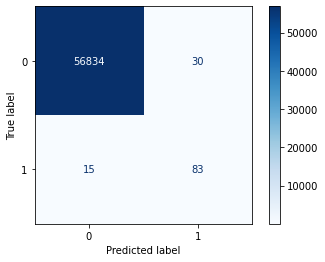

Akurasi: 0.9992
Recall: 0.8469
Precision: 0.7345
F1 Score: 0.7867

🔹 Confusion Matrix with threshold 0.2:


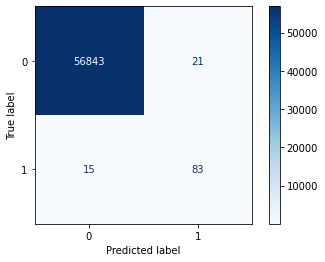

Akurasi: 0.9994
Recall: 0.8469
Precision: 0.7981
F1 Score: 0.8218

🔹 Confusion Matrix with threshold 0.3:


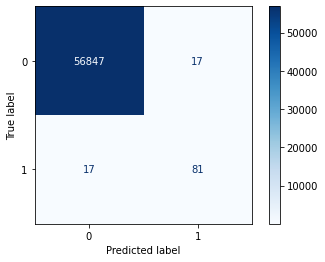

Akurasi: 0.9994
Recall: 0.8265
Precision: 0.8265
F1 Score: 0.8265

🔹 Confusion Matrix with threshold 0.4:


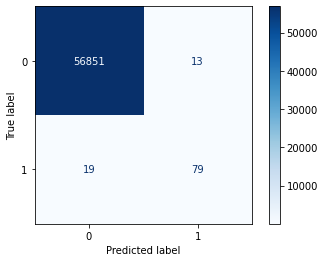

Akurasi: 0.9994
Recall: 0.8061
Precision: 0.8587
F1 Score: 0.8316

🔹 Confusion Matrix with threshold 0.5:


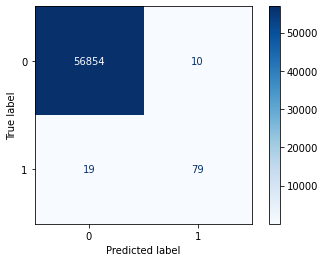

Akurasi: 0.9995
Recall: 0.8061
Precision: 0.8876
F1 Score: 0.8449

🔹 Confusion Matrix with threshold 0.6:


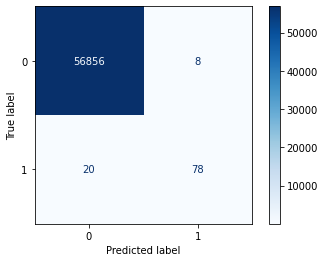

Akurasi: 0.9995
Recall: 0.7959
Precision: 0.9070
F1 Score: 0.8478

🔹 Confusion Matrix with threshold 0.7:


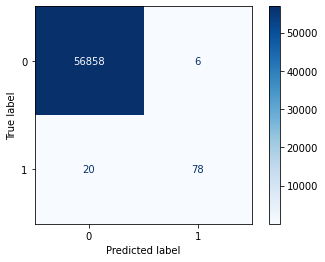

Akurasi: 0.9995
Recall: 0.7959
Precision: 0.9286
F1 Score: 0.8571

🔹 Confusion Matrix with threshold 0.8:


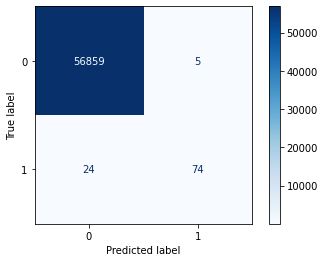

Akurasi: 0.9995
Recall: 0.7551
Precision: 0.9367
F1 Score: 0.8362

🔹 Confusion Matrix with threshold 0.9:


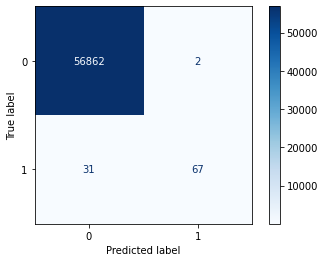

Akurasi: 0.9994
Recall: 0.6837
Precision: 0.9710
F1 Score: 0.8024


aucpr, precision curve, recall curve: 0.8529541851764085, [0.00172045 0.00172075 0.00172078 0.00172081 0.00172084 0.00172087
 0.0017209  0.00172093 0.00172096 0.00172099 0.00172102 0.00172105
 0.00172111 0.0017212  0.00172129 0.00172135 0.00172138 0.00172141
 0.00172144 0.00172147 0.0017215  0.00172153 0.00172156 0.00172159
 0.00172162 0.00172165 0.00172168 0.00172171 0.00172174 0.00172178
 0.00172181 0.00172184 0.00172187 0.0017219  0.00172193 0.00172196
 0.00172199 0.00172202 0.00172205 0.00172208 0.00172211 0.00172214
 0.00172217 0.0017222  0.00172223 0.00172226 0.00172229 0.00172232
 0.00172235 0.00172238 0.00172241 0.00172244 0.00172247 0.0017225
 0.00172253 0.00172256 0.00172259 0.00172262 0.00172265 0.00172268
 0.00172271 0.00172274 0.00172277 0.0017228  0.00172283 0.00172286
 0.0017229  0.00172293 0.00172296 0.00172299 0.00172302 0.00172305
 0.00172308 0.00172311 0.00172314 0.00172317 0.0017232  0.00172323
 0.0

1781/1781 [==============================] - 3s 2ms/step - loss: 0.1620 - accuracy: 0.9447 - precision: 0.0270 - recall: 0.8878 - f1_score: 0.0523 - aucpr: 0.4623

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.1620
🔹 Test Accuracy: 0.9447
🔹 Test Precision: 0.0270
🔹 Test Recall: 0.8878
🔹 Test F1 Score: 0.0523
🔹 Test AUCPR: 0.4623
1781/1781 [==============================] - 1s 440us/step
[1.27893686e-01 1.49841802e-02 6.77839935e-01 1.26806334e-01
 9.20613408e-01 2.41524309e-01 1.27889380e-01 1.84779659e-01
 4.37255437e-07 7.41237327e-02 3.40915867e-04 1.40455808e-03
 1.89062327e-01 1.27079964e-01 4.28019398e-08 9.81617565e-10
 1.89184919e-02 5.52317317e-07 1.25937968e-01 6.12682641e-01
 1.21036834e-07 2.91607201e-01 4.64622453e-02 1.27048701e-01
 1.68817062e-02 2.52516036e-10 3.17728240e-03 1.15241231e-02
 1.04977455e-13 6.03358785e-04 6.36670887e-01 4.04598366e-04
 1.58145756e-01 3.66447598e-01 1.73045862e-02 6.32267969e-04
 4.10692751e-01 3.39665338e-02 2.11232

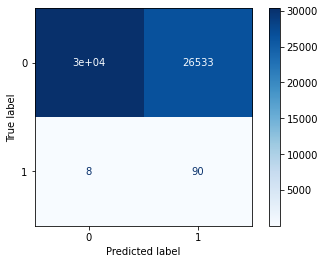

Akurasi: 0.5341
Recall: 0.9184
Precision: 0.0034
F1 Score: 0.0067

🔹 Confusion Matrix with threshold 0.2:


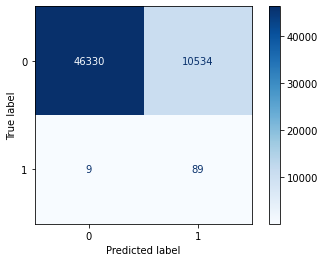

Akurasi: 0.8149
Recall: 0.9082
Precision: 0.0084
F1 Score: 0.0166

🔹 Confusion Matrix with threshold 0.3:


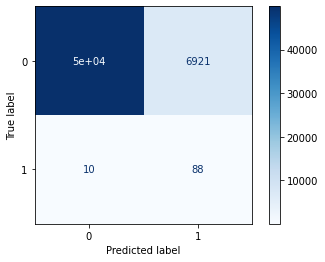

Akurasi: 0.8783
Recall: 0.8980
Precision: 0.0126
F1 Score: 0.0248

🔹 Confusion Matrix with threshold 0.4:


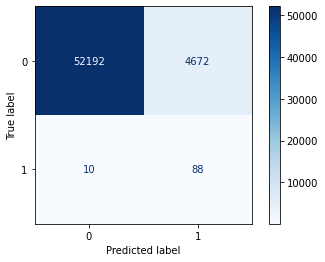

Akurasi: 0.9178
Recall: 0.8980
Precision: 0.0185
F1 Score: 0.0362

🔹 Confusion Matrix with threshold 0.5:


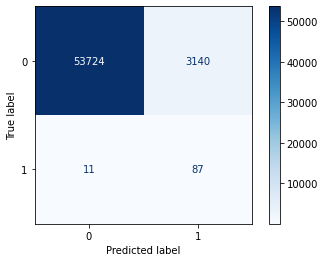

Akurasi: 0.9447
Recall: 0.8878
Precision: 0.0270
F1 Score: 0.0523

🔹 Confusion Matrix with threshold 0.6:


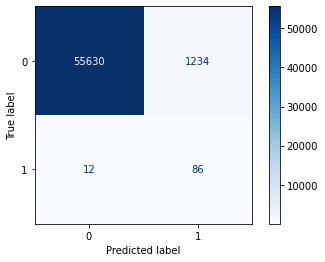

Akurasi: 0.9781
Recall: 0.8776
Precision: 0.0652
F1 Score: 0.1213

🔹 Confusion Matrix with threshold 0.7:


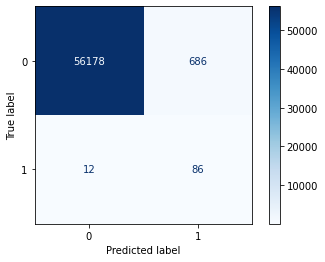

Akurasi: 0.9877
Recall: 0.8776
Precision: 0.1114
F1 Score: 0.1977

🔹 Confusion Matrix with threshold 0.8:


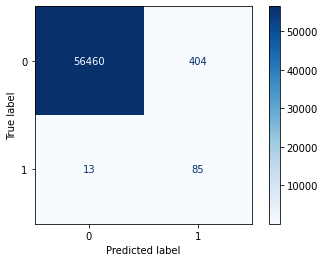

Akurasi: 0.9927
Recall: 0.8673
Precision: 0.1738
F1 Score: 0.2896

🔹 Confusion Matrix with threshold 0.9:


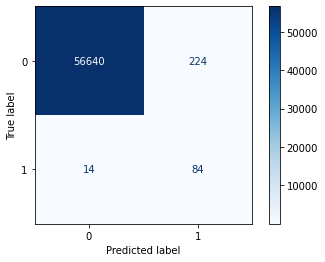

Akurasi: 0.9958
Recall: 0.8571
Precision: 0.2727
F1 Score: 0.4138


aucpr, precision curve, recall curve: 0.61451506879195, [0.00172045 0.0017302  0.00173023 0.00173026 0.00173029 0.00173032
 0.00173035 0.00173038 0.00173041 0.00173044 0.00173047 0.0017305
 0.00173053 0.00173056 0.00173059 0.00173062 0.00173065 0.00173068
 0.00173071 0.00173075 0.00173078 0.00173081 0.00173084 0.00173087
 0.0017309  0.00173093 0.00173096 0.00173099 0.00173102 0.00173105
 0.00173108 0.00173111 0.00173114 0.00173117 0.0017312  0.00173123
 0.00173127 0.0017313  0.00173133 0.00173136 0.00173139 0.00173142
 0.00173145 0.00173148 0.00173151 0.00173154 0.00173157 0.0017316
 0.00173163 0.00173166 0.00173169 0.00173172 0.00173175 0.00173179
 0.00173182 0.00173185 0.00173188 0.00173191 0.00173194 0.00173197
 0.001732   0.00173203 0.00173206 0.00173209 0.00173212 0.00173215
 0.00173218 0.00173221 0.00173224 0.00173228 0.00173231 0.00173234
 0.00173237 0.0017324  0.00173243 0.00173246 0.00173249 0.00173252
 0.0017

1781/1781 [==============================] - 3s 2ms/step - loss: 0.0485 - accuracy: 0.9842 - precision: 0.0900 - recall: 0.8980 - f1_score: 0.1636 - aucpr: 0.6012

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.0485
🔹 Test Accuracy: 0.9842
🔹 Test Precision: 0.0900
🔹 Test Recall: 0.8980
🔹 Test F1 Score: 0.1636
🔹 Test AUCPR: 0.6012
1781/1781 [==============================] - 1s 445us/step
[2.31515449e-02 8.68112475e-24 4.24331248e-01 1.16439136e-02
 2.18796101e-03 1.46389601e-03 0.00000000e+00 1.69780566e-27
 0.00000000e+00 0.00000000e+00 0.00000000e+00 6.23737715e-13
 0.00000000e+00 0.00000000e+00 0.00000000e+00 5.23651389e-09
 1.24251710e-13 8.80236833e-25 0.00000000e+00 1.56508449e-05
 2.78456403e-12 9.67662345e-06 4.84385691e-11 1.77040619e-07
 0.00000000e+00 5.29320503e-04 0.00000000e+00 3.61900718e-11
 0.00000000e+00 6.74118096e-12 7.34822974e-02 4.92130745e-08
 2.24671501e-34 6.49353904e-11 3.55169792e-22 6.94398497e-11
 0.00000000e+00 0.00000000e+00 0.00000

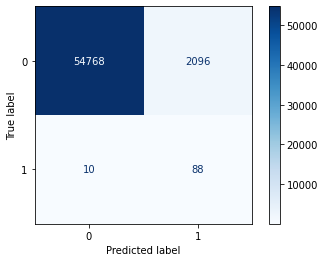

Akurasi: 0.9630
Recall: 0.8980
Precision: 0.0403
F1 Score: 0.0771

🔹 Confusion Matrix with threshold 0.2:


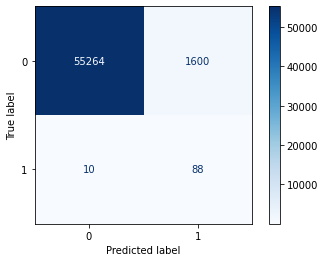

Akurasi: 0.9717
Recall: 0.8980
Precision: 0.0521
F1 Score: 0.0985

🔹 Confusion Matrix with threshold 0.3:


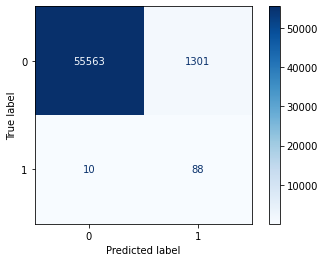

Akurasi: 0.9770
Recall: 0.8980
Precision: 0.0634
F1 Score: 0.1184

🔹 Confusion Matrix with threshold 0.4:


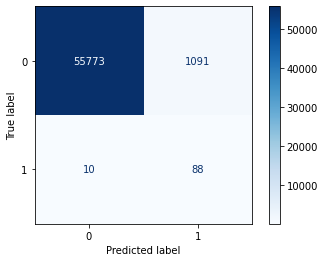

Akurasi: 0.9807
Recall: 0.8980
Precision: 0.0746
F1 Score: 0.1378

🔹 Confusion Matrix with threshold 0.5:


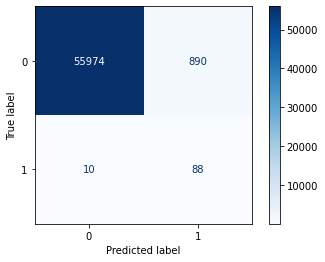

Akurasi: 0.9842
Recall: 0.8980
Precision: 0.0900
F1 Score: 0.1636

🔹 Confusion Matrix with threshold 0.6:


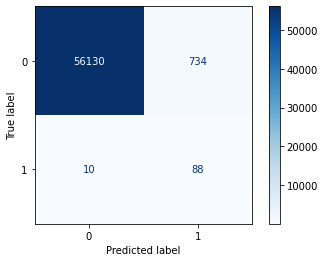

Akurasi: 0.9869
Recall: 0.8980
Precision: 0.1071
F1 Score: 0.1913

🔹 Confusion Matrix with threshold 0.7:


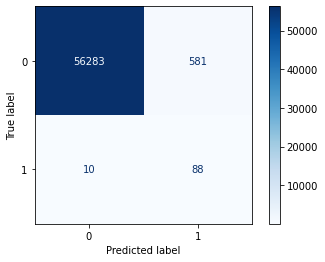

Akurasi: 0.9896
Recall: 0.8980
Precision: 0.1315
F1 Score: 0.2295

🔹 Confusion Matrix with threshold 0.8:


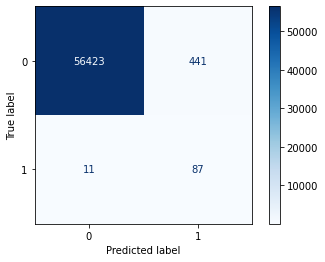

Akurasi: 0.9921
Recall: 0.8878
Precision: 0.1648
F1 Score: 0.2780

🔹 Confusion Matrix with threshold 0.9:


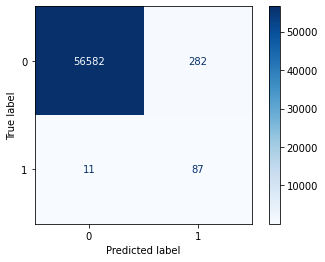

Akurasi: 0.9949
Recall: 0.8878
Precision: 0.2358
F1 Score: 0.3726


aucpr, precision curve, recall curve: 0.7639393603735037, [0.00172045 0.00253515 0.00253522 0.00253528 0.00253535 0.00253542
 0.00253548 0.00253555 0.00253562 0.00253568 0.00253575 0.00253582
 0.00253588 0.00253595 0.00253601 0.00253608 0.00253615 0.00253621
 0.00253628 0.00253635 0.00253641 0.00253648 0.00253654 0.00253661
 0.00253668 0.00253674 0.00253681 0.00253688 0.00253694 0.00253701
 0.00253708 0.00253714 0.00253721 0.00253727 0.00253734 0.00253741
 0.00253747 0.00253754 0.00253761 0.00253767 0.00253774 0.00253781
 0.00253787 0.00253794 0.002538   0.00253807 0.00253814 0.0025382
 0.00253827 0.00253834 0.0025384  0.00253847 0.00253854 0.0025386
 0.00253867 0.00253874 0.0025388  0.00253887 0.00253893 0.002539
 0.00253907 0.00253913 0.0025392  0.00253927 0.00253933 0.0025394
 0.00253947 0.00253953 0.0025396  0.00253967 0.00253973 0.0025398
 0.00253987 0.00253993 0.00254    0.00254006 0.00254013 0.00254026
 0.002540

1781/1781 [==============================] - 3s 2ms/step - loss: 0.5844 - accuracy: 0.9983 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0000e+00 - aucpr: 0.0017

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.5844
🔹 Test Accuracy: 0.9983
🔹 Test Precision: 0.0000
🔹 Test Recall: 0.0000
🔹 Test F1 Score: 0.0000
🔹 Test AUCPR: 0.0017
1781/1781 [==============================] - 1s 442us/step
[0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615
 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615
 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615
 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615
 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615
 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615
 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615
 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615 0.4423615
 0.4423

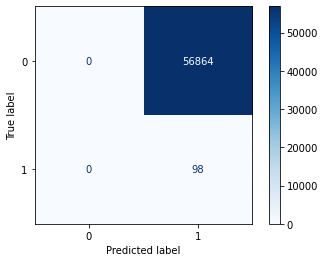

Akurasi: 0.0017
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.2:


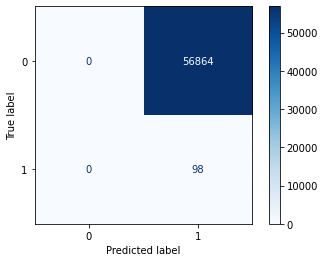

Akurasi: 0.0017
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.3:


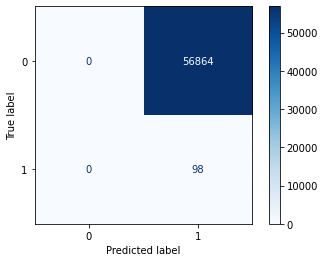

Akurasi: 0.0017
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.4:


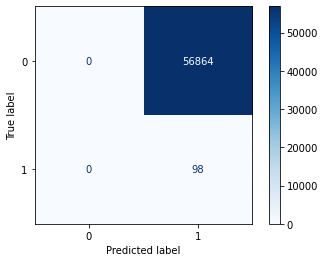

Akurasi: 0.0017
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.5:


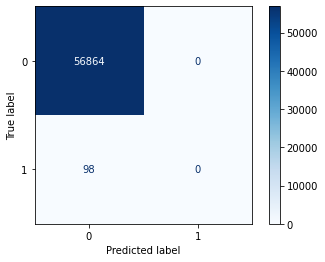

Akurasi: 0.9983
Recall: 0.0000
Precision: 0.0000
F1 Score: 0.0000

🔹 Confusion Matrix with threshold 0.6:


/home/g6421089/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


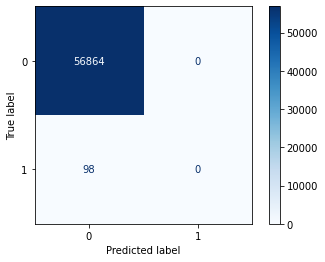

Akurasi: 0.9983
Recall: 0.0000
Precision: 0.0000
F1 Score: 0.0000

🔹 Confusion Matrix with threshold 0.7:


/home/g6421089/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


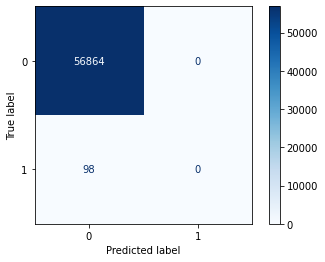

/home/g6421089/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Akurasi: 0.9983
Recall: 0.0000
Precision: 0.0000
F1 Score: 0.0000

🔹 Confusion Matrix with threshold 0.8:


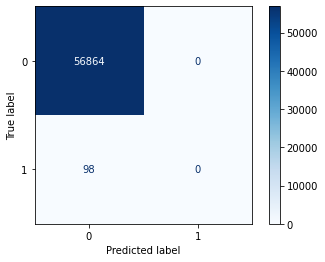

/home/g6421089/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Akurasi: 0.9983
Recall: 0.0000
Precision: 0.0000
F1 Score: 0.0000

🔹 Confusion Matrix with threshold 0.9:


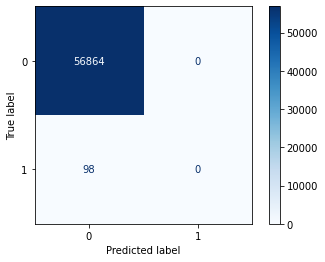

/home/g6421089/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Akurasi: 0.9983
Recall: 0.0000
Precision: 0.0000
F1 Score: 0.0000


aucpr, precision curve, recall curve: 0.0017204452090867595, [0.00172045 1.        ], [1. 0.]

==================== Evaluasi RUS Model ====================
1781/1781 [==============================] - 3s 2ms/step - loss: 0.6641 - accuracy: 0.6939 - precision: 0.0053 - recall: 0.9388 - f1_score: 0.0104 - aucpr: 0.5172

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.6641
🔹 Test Accuracy: 0.6939
🔹 Test Precision: 0.0053
🔹 Test Recall: 0.9388
🔹 Test F1 Score: 0.0104
🔹 Test AUCPR: 0.5172
1781/1781 [==============================] - 1s 448us/step
[0.45636693 0.5194245  0.5881334  0.5037552  0.5099457  0.49290648
 0.4519348  0.45836532 0.5204292  0.48282838 0.52753115 0.49663898
 0.4878725  0.5023602  0.487439   0.4973584  0.4578066  0.4433058
 0.39837265 0.50733143 0.48069388 0.47206482 0.48887387 0.45867977
 0.4972412  0.4368222  0.4816381  0.4879045  0.47187778 0.5206102
 0.49505663 0.50096107 0.48777

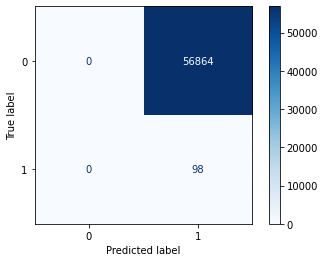

Akurasi: 0.0017
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.2:


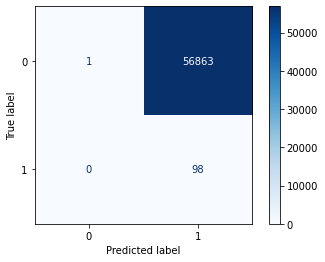

Akurasi: 0.0017
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.3:


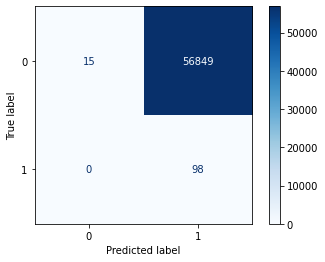

Akurasi: 0.0020
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.4:


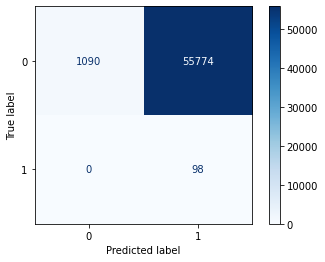

Akurasi: 0.0209
Recall: 1.0000
Precision: 0.0018
F1 Score: 0.0035

🔹 Confusion Matrix with threshold 0.5:


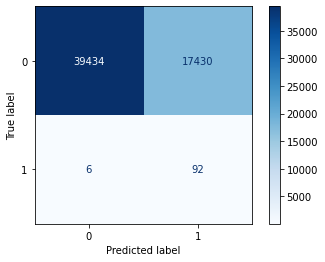

Akurasi: 0.6939
Recall: 0.9388
Precision: 0.0053
F1 Score: 0.0104

🔹 Confusion Matrix with threshold 0.6:


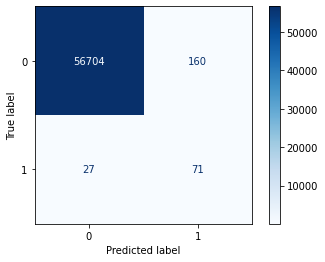

Akurasi: 0.9967
Recall: 0.7245
Precision: 0.3074
F1 Score: 0.4316

🔹 Confusion Matrix with threshold 0.7:


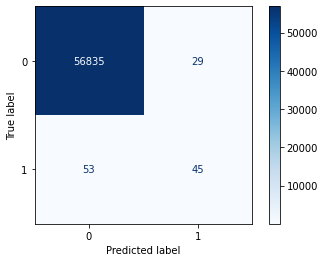

Akurasi: 0.9986
Recall: 0.4592
Precision: 0.6081
F1 Score: 0.5233

🔹 Confusion Matrix with threshold 0.8:


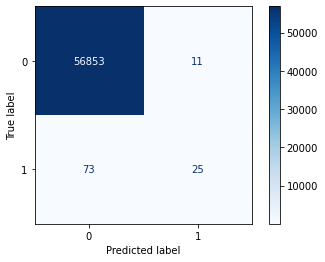

Akurasi: 0.9985
Recall: 0.2551
Precision: 0.6944
F1 Score: 0.3731

🔹 Confusion Matrix with threshold 0.9:


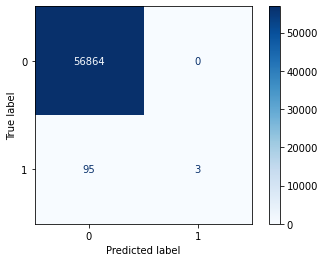

Akurasi: 0.9983
Recall: 0.0306
Precision: 1.0000
F1 Score: 0.0594


aucpr, precision curve, recall curve: 0.5222780606294234, [0.00172045 0.00172048 0.00172051 0.00172054 0.00172057 0.0017206
 0.00172063 0.00172066 0.00172069 0.00172072 0.00172075 0.00172078
 0.00172081 0.00172084 0.00172087 0.0017209  0.00172093 0.00172096
 0.00172099 0.00172102 0.00172105 0.00172108 0.00172111 0.00172114
 0.00172117 0.0017212  0.00172123 0.00172126 0.00172129 0.00172132
 0.00172135 0.00172138 0.00172141 0.00172144 0.00172147 0.0017215
 0.00172153 0.00172156 0.00172159 0.00172162 0.00172165 0.00172168
 0.00172171 0.00172174 0.00172178 0.00172181 0.00172184 0.00172187
 0.0017219  0.00172193 0.00172196 0.00172199 0.00172202 0.00172205
 0.00172208 0.00172211 0.00172214 0.00172217 0.0017222  0.00172223
 0.00172226 0.00172229 0.00172232 0.00172235 0.00172238 0.00172241
 0.00172244 0.00172247 0.0017225  0.00172253 0.00172256 0.00172259
 0.00172262 0.00172265 0.00172268 0.00172271 0.00172274 0.00172277
 0.00

1781/1781 [==============================] - 3s 2ms/step - loss: 0.8185 - accuracy: 0.8954 - precision: 0.0149 - recall: 0.9184 - f1_score: 0.0293 - aucpr: 0.1946

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.8185
🔹 Test Accuracy: 0.8954
🔹 Test Precision: 0.0149
🔹 Test Recall: 0.9184
🔹 Test F1 Score: 0.0293
🔹 Test AUCPR: 0.1946
1781/1781 [==============================] - 1s 459us/step
[3.44548549e-04 1.94256150e-18 9.46672785e-08 7.87396857e-05
 6.86046898e-01 6.90757151e-05 3.69689168e-09 4.63990490e-09
 1.24663595e-04 6.01024341e-10 9.99999881e-01 3.45792361e-02
 2.47804307e-18 2.83087132e-07 1.29804334e-06 1.27298551e-06
 2.68419512e-06 8.44308012e-10 1.64367884e-06 1.71960488e-01
 3.22640676e-06 6.86046898e-01 4.60702266e-12 4.64378036e-10
 5.47161705e-10 1.21322346e-05 2.60754424e-29 1.42027027e-04
 4.27370568e-13 7.88537506e-03 2.63666548e-02 3.21261887e-03
 9.20856633e-16 3.48548929e-05 1.54212717e-06 5.80426022e-05
 1.61506608e-02 8.20587229e-05 3.87448

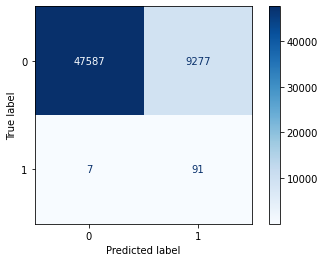

Akurasi: 0.8370
Recall: 0.9286
Precision: 0.0097
F1 Score: 0.0192

🔹 Confusion Matrix with threshold 0.2:


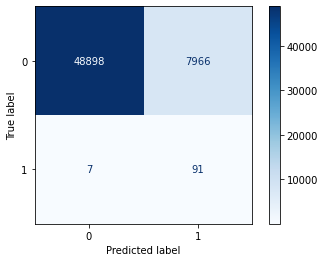

Akurasi: 0.8600
Recall: 0.9286
Precision: 0.0113
F1 Score: 0.0223

🔹 Confusion Matrix with threshold 0.3:


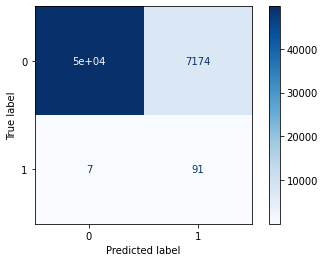

Akurasi: 0.8739
Recall: 0.9286
Precision: 0.0125
F1 Score: 0.0247

🔹 Confusion Matrix with threshold 0.4:


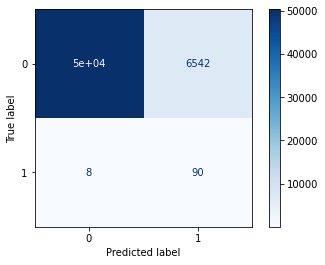

Akurasi: 0.8850
Recall: 0.9184
Precision: 0.0136
F1 Score: 0.0267

🔹 Confusion Matrix with threshold 0.5:


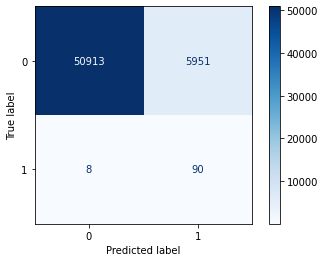

Akurasi: 0.8954
Recall: 0.9184
Precision: 0.0149
F1 Score: 0.0293

🔹 Confusion Matrix with threshold 0.6:


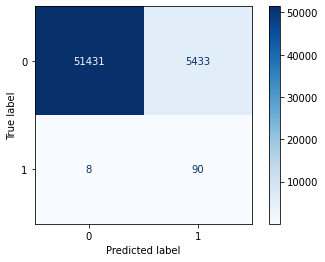

Akurasi: 0.9045
Recall: 0.9184
Precision: 0.0163
F1 Score: 0.0320

🔹 Confusion Matrix with threshold 0.7:


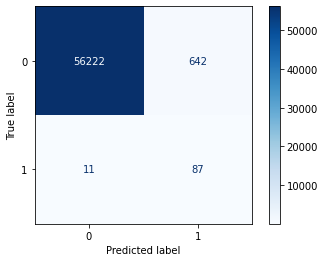

Akurasi: 0.9885
Recall: 0.8878
Precision: 0.1193
F1 Score: 0.2104

🔹 Confusion Matrix with threshold 0.8:


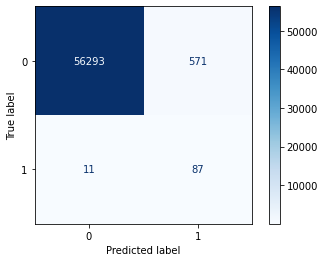

Akurasi: 0.9898
Recall: 0.8878
Precision: 0.1322
F1 Score: 0.2302

🔹 Confusion Matrix with threshold 0.9:


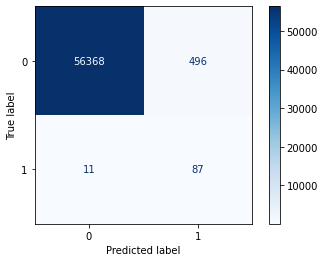

Akurasi: 0.9911
Recall: 0.8878
Precision: 0.1492
F1 Score: 0.2555


aucpr, precision curve, recall curve: 0.4605503048613538, [0.00172045 0.00172344 0.00172347 0.0017235  0.00172353 0.00172356
 0.00172359 0.00172362 0.00172365 0.00172368 0.00172371 0.00172374
 0.00172377 0.0017238  0.00172383 0.00172386 0.0017239  0.00172393
 0.00172396 0.00172399 0.00172402 0.00172405 0.00172408 0.00172411
 0.00172414 0.00172417 0.0017242  0.00172423 0.00172426 0.00172429
 0.00172432 0.00172435 0.00172438 0.00172441 0.00172444 0.00172447
 0.0017245  0.00172453 0.00172456 0.00172459 0.00172462 0.00172465
 0.00172468 0.00172471 0.00172474 0.00172478 0.00172481 0.00172484
 0.00172487 0.0017249  0.00172493 0.00172496 0.00172499 0.00172502
 0.00172505 0.00172508 0.00172511 0.00172514 0.00172517 0.0017252
 0.00172523 0.00172526 0.00172529 0.00172532 0.00172535 0.00172538
 0.00172541 0.00172544 0.00172547 0.0017255  0.00172553 0.00172556
 0.0017256  0.00172563 0.00172566 0.00172569 0.00172572 0.00172575
 0.0

1781/1781 [==============================] - 3s 2ms/step - loss: 0.6342 - accuracy: 0.7268 - precision: 0.0055 - recall: 0.8776 - f1_score: 0.0109 - aucpr: 0.4459

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.6342
🔹 Test Accuracy: 0.7268
🔹 Test Precision: 0.0055
🔹 Test Recall: 0.8776
🔹 Test F1 Score: 0.0109
🔹 Test AUCPR: 0.4459
1781/1781 [==============================] - 1s 433us/step
[4.49261367e-01 5.08981586e-01 3.82679611e-01 4.13706779e-01
 4.46144938e-01 4.80390131e-01 4.67693299e-01 4.78780717e-01
 3.94323736e-01 5.12360275e-01 2.93369532e-01 4.83811051e-01
 5.12596428e-01 4.16934997e-01 4.57324028e-01 4.47542995e-01
 4.49874967e-01 5.39794981e-01 4.35297519e-01 4.81727928e-01
 4.44424182e-01 4.95799839e-01 4.83101875e-01 4.90240604e-01
 4.91018325e-01 4.95871633e-01 2.14522436e-01 5.06754696e-01
 4.90385324e-01 5.13178229e-01 4.94138747e-01 4.10357207e-01
 4.65423346e-01 4.71359313e-01 5.06053567e-01 4.32068408e-01
 4.47893739e-01 4.77080792e-01 5.04330

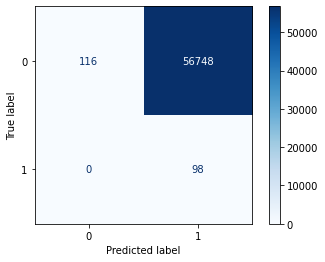

Akurasi: 0.0038
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.2:


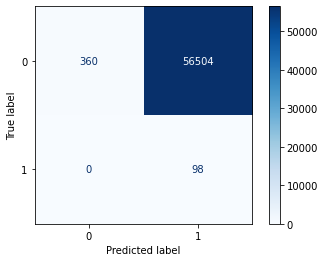

Akurasi: 0.0080
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0035

🔹 Confusion Matrix with threshold 0.3:


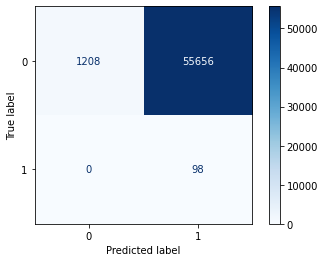

Akurasi: 0.0229
Recall: 1.0000
Precision: 0.0018
F1 Score: 0.0035

🔹 Confusion Matrix with threshold 0.4:


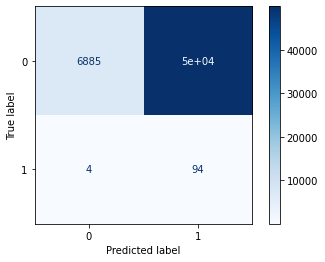

Akurasi: 0.1225
Recall: 0.9592
Precision: 0.0019
F1 Score: 0.0037

🔹 Confusion Matrix with threshold 0.5:


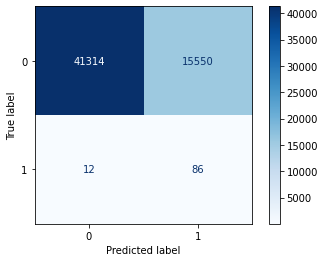

Akurasi: 0.7268
Recall: 0.8776
Precision: 0.0055
F1 Score: 0.0109

🔹 Confusion Matrix with threshold 0.6:


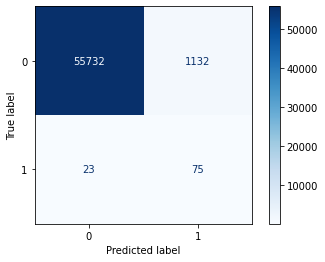

Akurasi: 0.9797
Recall: 0.7653
Precision: 0.0621
F1 Score: 0.1149

🔹 Confusion Matrix with threshold 0.7:


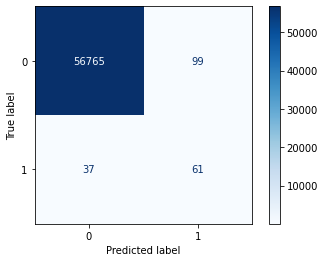

Akurasi: 0.9976
Recall: 0.6224
Precision: 0.3812
F1 Score: 0.4729

🔹 Confusion Matrix with threshold 0.8:


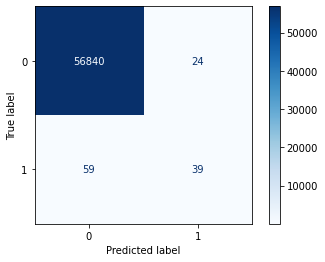

Akurasi: 0.9985
Recall: 0.3980
Precision: 0.6190
F1 Score: 0.4845

🔹 Confusion Matrix with threshold 0.9:


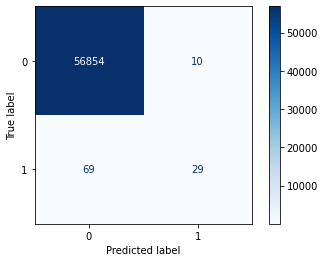

Akurasi: 0.9986
Recall: 0.2959
Precision: 0.7436
F1 Score: 0.4234


aucpr, precision curve, recall curve: 0.4478111275423599, [0.00172045 0.00172048 0.00172051 0.00172054 0.00172057 0.0017206
 0.00172063 0.00172066 0.00172069 0.00172072 0.00172075 0.00172078
 0.00172081 0.00172084 0.00172087 0.0017209  0.00172093 0.00172096
 0.00172099 0.00172102 0.00172105 0.00172108 0.00172111 0.00172114
 0.00172117 0.0017212  0.00172123 0.00172126 0.00172129 0.00172132
 0.00172135 0.00172138 0.00172141 0.00172144 0.00172147 0.0017215
 0.00172153 0.00172156 0.00172159 0.00172162 0.00172165 0.00172168
 0.00172171 0.00172174 0.00172178 0.00172181 0.00172184 0.00172187
 0.0017219  0.00172193 0.00172196 0.00172199 0.00172202 0.00172205
 0.00172208 0.00172211 0.00172214 0.00172217 0.0017222  0.00172223
 0.00172226 0.00172229 0.00172232 0.00172235 0.00172238 0.00172241
 0.00172244 0.00172247 0.0017225  0.00172253 0.00172256 0.00172259
 0.00172262 0.00172265 0.00172268 0.00172271 0.00172274 0.00172277
 0.00

1781/1781 [==============================] - 3s 2ms/step - loss: 0.2525 - accuracy: 0.9990 - precision: 0.6847 - recall: 0.7755 - f1_score: 0.7273 - aucpr: 0.5329

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.2525
🔹 Test Accuracy: 0.9990
🔹 Test Precision: 0.6847
🔹 Test Recall: 0.7755
🔹 Test F1 Score: 0.7273
🔹 Test AUCPR: 0.5329
1781/1781 [==============================] - 1s 437us/step
[0.22017276 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276
 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276
 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276
 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276
 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276
 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276
 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276
 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276 0.22017276
 0.22017276 0.22017276 0.22017276 0.22017276 0.2201

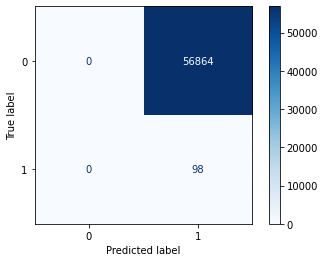

Akurasi: 0.0017
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.2:


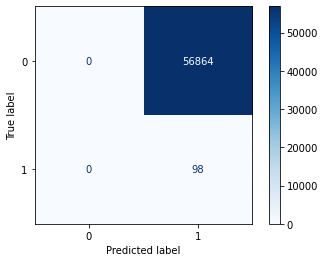

Akurasi: 0.0017
Recall: 1.0000
Precision: 0.0017
F1 Score: 0.0034

🔹 Confusion Matrix with threshold 0.3:


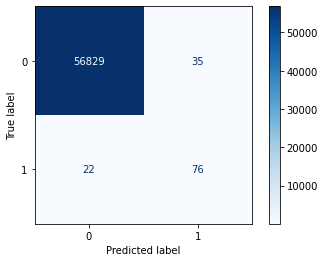

Akurasi: 0.9990
Recall: 0.7755
Precision: 0.6847
F1 Score: 0.7273

🔹 Confusion Matrix with threshold 0.4:


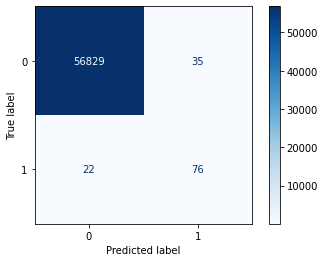

Akurasi: 0.9990
Recall: 0.7755
Precision: 0.6847
F1 Score: 0.7273

🔹 Confusion Matrix with threshold 0.5:


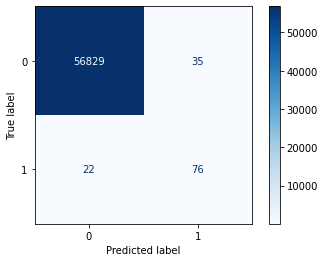

Akurasi: 0.9990
Recall: 0.7755
Precision: 0.6847
F1 Score: 0.7273

🔹 Confusion Matrix with threshold 0.6:


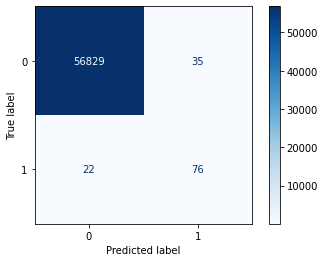

Akurasi: 0.9990
Recall: 0.7755
Precision: 0.6847
F1 Score: 0.7273

🔹 Confusion Matrix with threshold 0.7:


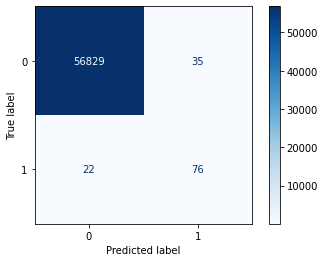

Akurasi: 0.9990
Recall: 0.7755
Precision: 0.6847
F1 Score: 0.7273

🔹 Confusion Matrix with threshold 0.8:


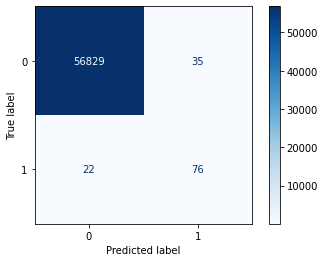

Akurasi: 0.9990
Recall: 0.7755
Precision: 0.6847
F1 Score: 0.7273

🔹 Confusion Matrix with threshold 0.9:


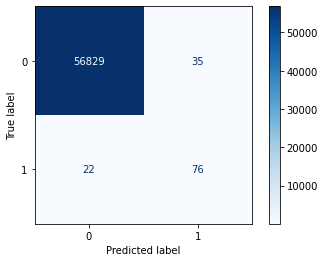

Akurasi: 0.9990
Recall: 0.7755
Precision: 0.6847
F1 Score: 0.7273


aucpr, precision curve, recall curve: 0.5313661819452647, [0.00172045 0.68468468 1.        ], [1.        0.7755102 0.       ]

==================== Evaluasi RUS + SMOTE Model ====================
1781/1781 [==============================] - 3s 2ms/step - loss: 0.0343 - accuracy: 0.9988 - precision: 0.5944 - recall: 0.8673 - f1_score: 0.7054 - aucpr: 0.6196

🔹 **Metrics Evaluation before adjusting threshold: **
🔹 Test Loss: 0.0343
🔹 Test Accuracy: 0.9988
🔹 Test Precision: 0.5944
🔹 Test Recall: 0.8673
🔹 Test F1 Score: 0.7054
🔹 Test AUCPR: 0.6196
1781/1781 [==============================] - 1s 445us/step
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.02209735e-18 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.

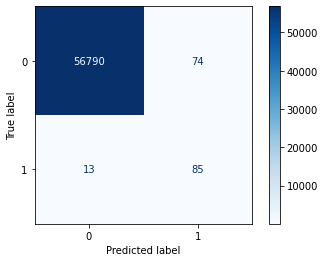

Akurasi: 0.9985
Recall: 0.8673
Precision: 0.5346
F1 Score: 0.6615

🔹 Confusion Matrix with threshold 0.2:


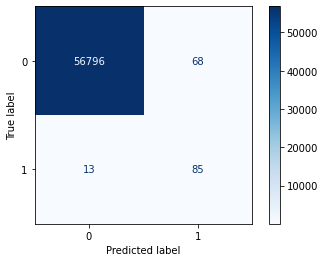

Akurasi: 0.9986
Recall: 0.8673
Precision: 0.5556
F1 Score: 0.6773

🔹 Confusion Matrix with threshold 0.3:


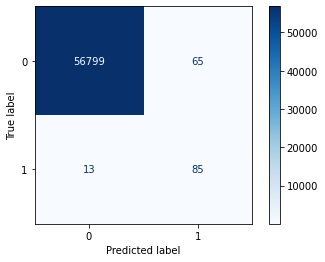

Akurasi: 0.9986
Recall: 0.8673
Precision: 0.5667
F1 Score: 0.6855

🔹 Confusion Matrix with threshold 0.4:


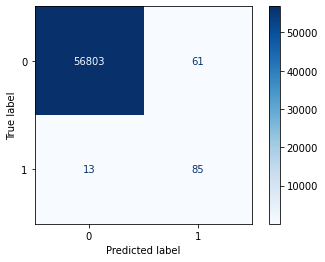

Akurasi: 0.9987
Recall: 0.8673
Precision: 0.5822
F1 Score: 0.6967

🔹 Confusion Matrix with threshold 0.5:


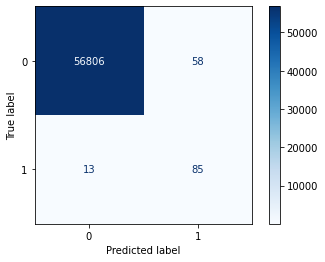

Akurasi: 0.9988
Recall: 0.8673
Precision: 0.5944
F1 Score: 0.7054

🔹 Confusion Matrix with threshold 0.6:


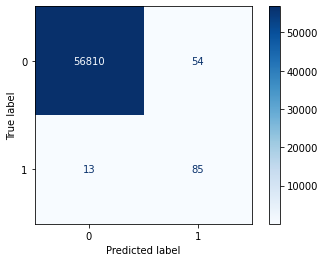

Akurasi: 0.9988
Recall: 0.8673
Precision: 0.6115
F1 Score: 0.7173

🔹 Confusion Matrix with threshold 0.7:


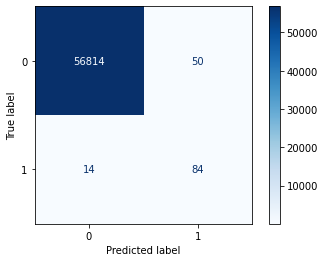

Akurasi: 0.9989
Recall: 0.8571
Precision: 0.6269
F1 Score: 0.7241

🔹 Confusion Matrix with threshold 0.8:


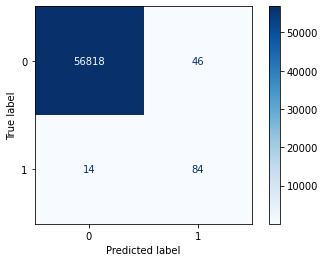

Akurasi: 0.9989
Recall: 0.8571
Precision: 0.6462
F1 Score: 0.7368

🔹 Confusion Matrix with threshold 0.9:


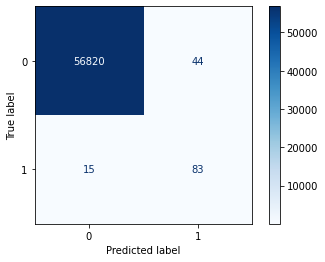

Akurasi: 0.9990
Recall: 0.8469
Precision: 0.6535
F1 Score: 0.7378


aucpr, precision curve, recall curve: 0.6581939962531751, [0.00172045 0.02993817 0.02994792 0.02995767 0.02996743 0.02997719
 0.02998696 0.02999674 0.03000652 0.03001631 0.03002611 0.03003591
 0.03004572 0.03005554 0.03006536 0.03007519 0.03008502 0.03009486
 0.03010471 0.03011457 0.03012443 0.03013429 0.03014417 0.03015405
 0.03016393 0.03017383 0.03018373 0.03019363 0.03020355 0.03021346
 0.03022339 0.03023332 0.03024326 0.03025321 0.03026316 0.03027312
 0.03028308 0.03029305 0.03030303 0.03031301 0.03032301 0.030333
 0.03034301 0.03035302 0.03036304 0.03037306 0.03038309 0.03039313
 0.03040317 0.03041322 0.03042328 0.03043334 0.03044341 0.03045349
 0.03046358 0.03047367 0.03048376 0.03049387 0.03050398 0.0305141
 0.03052422 0.03053435 0.03054449 0.03055463 0.03056478 0.03057494
 0.03058511 0.03059528 0.03060546 0.03061564 0.03062583 0.03063603
 0.03064624 0.03065645 0.03066667 0.03067689 0.03068712 0.03069736
 0.030

In [168]:
# Evaluasi model 
aucpr, precision_pr, recall_pr = evaluate_model(best_model, df_X_test_selected, y_test, model_name="No Method Model")

# Evaluasi model ROS
aucpr_ros, precision_pr_ros, recall_pr_ros = evaluate_model(best_model_ros, df_X_ros_test_selected, y_test, model_name="ROS Model")

# Evaluasi model SMOTE
aucpr_smote, precision_pr_smote, recall_pr_smote = evaluate_model(best_model_smote, df_X_smote_test_selected, y_test, model_name="SMOTE Model")

# Evaluasi model Adasyn
aucpr_adaysn, precision_pr_adaysn, recall_pr_adaysn = evaluate_model(best_model_adasyn, df_X_adasyn_test_selected, y_test, model_name="Adasyn Model")

# Evaluasi model RUS
aucpr_rus, precision_pr_rus, recall_pr_rus = evaluate_model(best_model_rus, df_X_rus_test_selected, y_test, model_name="RUS Model")

# Evaluasi model ROS + RUS
aucpr_ros_to_rus, precision_pr_ros_to_rus, recall_pr_ros_to_rus = evaluate_model(best_model_ros_to_rus, df_X_ros_to_rus_test_selected, y_test, model_name="ROS + RUS Model")

# Evaluasi model SMOTE + RUS
aucpr_smote_to_rus, precision_pr_smote_to_rus, recall_pr_smote_to_rus = evaluate_model(best_model_smote_to_rus, df_X_smote_to_rus_test_selected, y_test, model_name="SMOTE + RUS Model")

# Evaluasi model RUS + ROS
aucpr_rus_to_ros, precision_pr_rus_to_ros, recall_pr_rus_to_ros = evaluate_model(best_model_rus_to_ros, df_X_rus_to_ros_test_selected, y_test, model_name="RUS + ROS Model")

# Evaluasi model RUS + SMOTE
aucpr_rus_to_smote, precision_pr_rus_to_smote, recall_pr_rus_to_smote = evaluate_model(best_model_rus_to_smote, df_X_rus_to_smote_test_selected, y_test, model_name="RUS + SMOTE Model")

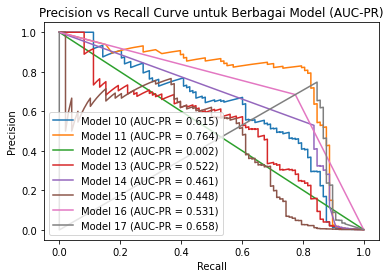

In [172]:
aucpr_all = [aucpr_ros, aucpr_smote, aucpr_adaysn, aucpr_rus, aucpr_ros_to_rus, aucpr_smote_to_rus, aucpr_rus_to_ros, aucpr_rus_to_smote]
precision_all = [precision_pr_ros, precision_pr_smote, precision_pr_adaysn, precision_pr_rus, precision_pr_ros_to_rus, precision_pr_smote_to_rus, precision_pr_rus_to_ros, precision_pr_rus_to_smote]
recall_all = [recall_pr_ros, recall_pr_smote, recall_pr_adaysn, recall_pr_rus, recall_pr_ros_to_rus, recall_pr_smote_to_rus, recall_pr_rus_to_ros, recall_pr_rus_to_smote]
name_model = ["Model 10", "Model 11" ,"Model 12" ,"Model 13", "Model 14", "Model 15", "Model 16", "Model 17"]


for i in range(0, len(aucpr_all)):
    plt.plot(recall_all[i], precision_all[i], label=f'{name_model[i]} (AUC-PR = {aucpr_all[i]:.3f})')

# Menambahkan label dan judul
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision vs Recall Curve untuk Berbagai Model (AUC-PR)')
plt.legend(loc='best')

# Menampilkan grafik
plt.show()

In [173]:
current_time = datetime.now()

# Mencetak waktu dalam format jam:menit:detik
print("end of testing")
print(current_time.strftime("%H:%M:%S"))

end of testing
01:02:51


In [174]:
!nvidia-smi

Wed Jul 23 01:02:52 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.42.02              Driver Version: 555.42.02      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 2060        Off |   00000000:2B:00.0 Off |                  N/A |
|  0%   61C    P0             34W /  183W |    4734MiB /   6144MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----